In [2]:
#Analysis of consturction sector (the renewables and solar) in Ireland 
#An existing dataset of the relatively new and expanding indusrty does exist (except for the SEAI database), so a seperate webscraping tak was undertaken to develop this dataset. 
#Initally, beutiful soup and python was used for the webscraping, however, various captacha challenges deemed this approach unacceptable. The extract was done using Octoparse and an image of the work flow can be found in the report for infomration.
#Three data sets were created initiall and others followed- Two extracts from VisionnetID.ie (Irish companies involved in renewables) and Global database companies search in IE)

import pandas as pd
Vision_new_df = pd.read_excel('full Company Info - Vision-Net.xlsx')
GDB_df = pd.read_excel('Solar IE.GlobalDatabase.com.xlsx')
Vision_Solar_df = pd.read_excel('vision net ID solar companies.xlsx')

In [3]:

%%html
<style>
/* Add custom CSS for numbering the entire notebook */
.container {
    counter-reset: notebook-counter;
}

.container .cell {
    counter-increment: notebook-counter;
}

.container .cell:before {
    content: "Cell " counter(notebook-counter) ": ";
}
</style>

In [4]:
 Vision_new_df.head(50)

,CompanyName,CompanyStatus,CompanyAddress,CompanySize,CompanySize1,CompanySize_URL,Established,CompanyType
0,Solar Sounds Limited,DISSOLVED,"2 Carlton Terrace,\nNavaro Road,\nBray Co. Wic...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,14/05/1969 (21 years in business).,Private
1,Solar Investments Limited,DISSOLVED,"Bective House,\nDawson Street,\nDublin 2.,\nDu...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,26/06/1973 (17 years in business).,Private
2,Solar Thermal Glazing Co. Limited,DISSOLVED,"65 Collins Avenue,\nDonnycarney,\nDublin 9.,\n...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,22/04/1974 (15 years in business).,Private
3,Irish Solar Energy Limited,DISSOLVED,"6 Lower Hatch Street,\nDublin 2.,\nDublin 2,Du...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,29/11/1974 (15 years in business).,Private
4,Solarship (Ireland) Limited,DISSOLVED,"Alexander Basin,\nNorth Wall,\nDublin 1.,\nDublin",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,04/05/1977 (12 years in business).,Private
5,Solar Energy Systems Limited,DISSOLVED,"19 Charlestown Road,\nRanelagh,\nDublin 7.,\nD...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,16/11/1977 (12 years in business).,Private
6,Solar Control Films Limited,DISSOLVED,"Solar House,\nSt. Martins Road,\nRosslare Harb...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,22/05/1978 (10 years in business).,Private
7,Wind and Solar Technology Limited,DISSOLVED,"70 Clifton Grange,\nCork.,\nDouglas,Cork",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,26/01/1979 (10 years in business).,Private
8,Solarex (Ireland) Limited,DISSOLVED,"Coast Road,\nCo. Dublin.,\nPortmarnock,Dublin",Mr Nagle,NaN,NaN,Log-In To View,Private
9,Renew Tyres Limited,NORMAL,"Kilcoole Industrial Estate,\nCo. Wicklow.,\nKi...",+353 (0)1 287 3366,NaN,NaN,www.renew.ie,NaN


In [5]:
 Vision_new_df.tail()

,CompanyName,CompanyStatus,CompanyAddress,CompanySize,CompanySize1,CompanySize_URL,Established,CompanyType
807,NaN,NaN,NaN,Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,NaN,NaN
808,Solar Turbines Europe S.A.,NORMAL,"C/O Mespil Business Centre,\nMespil House,\nSu...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,NaN,NaN
809,Evolution Partners (Ireland) Limited,CEASED IRL,"Clifton House,\nFitzwilliam Street Lower,\nDub...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,NaN,NaN
810,Sma Solar Technology Ag,NORMAL,"6th Floor,\nRiverpoint,\nLower Mallow Street,\...",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,NaN,External Company
811,Jbm Solar Limited,NORMAL,"54 Main Street,\nDundrum,\n,Ireland",Mr Pillai,NaN,NaN,Log-In To View,External Company


In [6]:
 Vision_new_df.describe() 

,CompanyName,CompanyStatus,CompanyAddress,CompanySize,CompanySize1,CompanySize_URL,Established,CompanyType
count,810,810,810,811,101,101,770,330
unique,810,7,574,409,9,9,104,13
top,Solar Sounds Limited,NORMAL,"11 Anglesea Street,\nCo. Cork, Cork",Log-In To View,Log-In,https://www.vision-net.ie/loginNoFrame.jsp,Log-In To View,LTD - Private Company Limited By Shares
freq,1,527,32,93,93,93,655,192


In [7]:
 Vision_new_df.info()       # data type and missing value information


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 812 entries, 0 to 811
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   CompanyName      810 non-null    object
 1   CompanyStatus    810 non-null    object
 2   CompanyAddress   810 non-null    object
 3   CompanySize      811 non-null    object
 4   CompanySize1     101 non-null    object
 5   CompanySize_URL  101 non-null    object
 6   Established      770 non-null    object
 7   CompanyType      330 non-null    object
dtypes: object(8)
memory usage: 50.9+ KB


In [8]:
#dropping three colums as the data is not relevant and requires logging into visionnetID to extract.
Vision_new_df =  Vision_new_df.drop(['CompanySize', 'CompanySize1', 'CompanySize_URL'], axis=1)

In [9]:
 Vision_new_df.shape

(812, 5)

In [10]:
# data cleaning steps - recoding variables, correcting data types and removing redundant symobols
#Remove the symbol infront of the price and replace name: 

Vision_new_df.rename(columns={'CompanyName':'Name'}, inplace=True)
Vision_new_df.rename(columns={'CompanyStatus':'Status'}, inplace=True)
Vision_new_df.rename(columns={'CompanyAddress':'Full_Add'}, inplace=True)
Vision_new_df.rename(columns={'Not Full Market Price':'price_nm'}, inplace=True)
Vision_new_df.rename(columns={'CompanyType':'Type'}, inplace=True)


In [11]:
 Vision_new_df.info()  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 812 entries, 0 to 811
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Name         810 non-null    object
 1   Status       810 non-null    object
 2   Full_Add     810 non-null    object
 3   Established  770 non-null    object
 4   Type         330 non-null    object
dtypes: object(5)
memory usage: 31.8+ KB


In [12]:
#exploring minipulation of addresses for the puropse of understanding the geospatial realtionships of the data and profile of this new construction indusrt in ROI
import re
from geopy.geocoders import Nominatim
import time

# set a custom user agent for Nominatim
geolocator = Nominatim(user_agent="Solar_IE_project2023")

# define a function to clean and standardize the addresses
    
def clean_address(address):
    # check if the address is a string
    if not isinstance(address, str):
        return None
    # remove any commas at the end of the address
    address = re.sub(r',\s*$', '', address)
    # convert the address to title case
    address = address.lower()
    # replace abbreviations with their full words
    address = address.replace("st.", "street")
    # remove extra whitespace and commas between words
    address = re.sub(r'\s*,\s*',' ', address).strip()
    # add "Ireland" to the end of the address
    address += " Ireland"
    return address

# create empty lists to store latitude and longitude values
latitudes = []
longitudes = []

# iterate over each address in the 'Full_Add' column
for address in Vision_new_df['Full_Add']:
    # clean and standardize the address
    address = clean_address(address)
    print("Geocoding address:", address)
    try:
        location = geolocator.geocode(address)
        latitude = location.latitude
        longitude = location.longitude
        latitudes.append(latitude)
        longitudes.append(longitude)
        print("Location found: latitude = {}, longitude = {}".format(latitude, longitude))
    except:
        latitude = None
        longitude = None
        latitudes.append(latitude)
        longitudes.append(longitude)
        print("Location not found")
    # add a delay of 1 second between geocoding requests
    time.sleep(1)
  
# add the 'latitudes' and 'longitudes' lists as new columns to the dataframe
Vision_new_df['latitude'] = pd.Series(latitudes, index=Vision_new_df.index)
Vision_new_df['longitude'] = pd.Series(longitudes, index=Vision_new_df.index)

# create a Pandas dataframe from the 'Vision_new_df' dataframe
df = pd.DataFrame(Vision_new_df)

# write the dataframe to an xls file as the geocoding takes a long time and is more accessible this way.
Vision_new_df.to_excel('Vision_new_map.xlsx', index=False)


Geocoding address: 2 carlton terrace navaro road bray co. wicklow. bray wicklow Ireland
Location not found
Geocoding address: bective house dawson street dublin 2. dublin 2 dublin Ireland
Location not found
Geocoding address: 65 collins avenue donnycarney dublin 9. dublin Ireland
Location found: latitude = 53.376074620073126, longitude = -6.220771626839863
Geocoding address: 6 lower hatch street dublin 2. dublin 2 dublin Ireland
Location found: latitude = 53.3341505, longitude = -6.2562891
Geocoding address: alexander basin north wall dublin 1. dublin Ireland
Location not found
Geocoding address: 19 charlestown road ranelagh dublin 7. dublin Ireland
Location not found
Geocoding address: solar house street martins road rosslare harbour co. wexford. wexford Ireland
Location not found
Geocoding address: 70 clifton grange cork. douglas cork Ireland
Location not found
Geocoding address: coast road co. dublin. portmarnock dublin Ireland
Location found: latitude = 53.4093811, longitude = -6.1

KeyboardInterrupt: 

In [14]:
Vision_new_df.columns

Index(['Name', 'Status', 'Full_Add', 'Established', 'Type'], dtype='object')

In [15]:
Vision_new_df.shape

(812, 5)

In [16]:
#USEFINAL
import folium

# create a map centered on Ireland
map_center = [53.3498, -6.2603]
ireland_map = folium.Map(location=map_center, zoom_start=7)

# create feature groups for the markers
normal_fg = folium.FeatureGroup(name='NORMAL')
dissolved_fg = folium.FeatureGroup(name='DISSOLVED')
ceased_fg = folium.FeatureGroup(name='CEASED IRL')
dissolved_20_fg = folium.FeatureGroup(name='DISSOLVED-20 YEARS')
na_fg = folium.FeatureGroup(name='N/A')

# filter out rows with nan status
Vision_filtered_df = Vision_new_df.dropna(subset=['Status'])

# add markers for each data point
for index, row in Vision_new_df.iterrows():
    address = row['Full_Add']
    status = row['Status']
    latitude = row['latitude']
    longitude = row['longitude']
    Name = row['Name']

    # add a marker for the data point, color-coded based on status
    if status == 'NORMAL':
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='green'))
        marker.add_to(normal_fg)
    elif status == 'DISSOLVED':
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='red'))
        marker.add_to(dissolved_fg)
    elif status == 'CEASED IRL':
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='orange'))
        marker.add_to(ceased_fg)
    elif status == 'DISSOLVED-20 YEARS':
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='black'))
        marker.add_to(dissolved_20_fg)
    elif pd.isna(status):
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='gray'))
        marker.add_to(na_fg)

# add the feature groups to the map
normal_fg.add_to(ireland_map)
dissolved_fg.add_to(ireland_map)
ceased_fg.add_to(ireland_map)
dissolved_20_fg.add_to(ireland_map)
na_fg.add_to(ireland_map)

# add layer control to the map
folium.map.LayerControl(position='topright', collapsed=False).add_to(ireland_map)

# display the map
ireland_map



KeyError: 'latitude'

In [17]:
# This is the start of the analysis of the second scraped database - Global database of registered companies in Ireland followig a search for Solar.
#The second interantional dataset was used to verifiy the irish dataset.

In [18]:
GDB_df.head()

,Title,Title_URL,badge,btnsubscribe,Company,Company1,Company2,Company3,Company4,Company5,Company6,Company7,Company8,Company9,Company10,Company11,Company12,Company13,Company14,Company15
0,MY SOLAR LIMITED,https://ie.globaldatabase.com/company/my-solar...,ACTIVE,Buy Credit Report,IE651647,Age of business,4 years,Nr of Employees,3,Revenue,---,Industry,-,Country,Email,Unavailable,City,DONACARNEY,Website,Phone
1,BLUE PINE SOLAR 21 LIMITED,https://ie.globaldatabase.com/company/blue-pin...,ACTIVE,Buy Credit Report,IE648340,Age of business,4 years,Nr of Employees,7,Revenue,---,Industry,35110 - Production of electricity,Country,Email,Unavailable,City,19-26 PEMBROKE STREET LOWER,Website,Phone
2,SOLAR MOTORWAYS LIMITED,https://ie.globaldatabase.com/company/solar-mo...,ACTIVE,Buy Credit Report,IE718852,Age of business,1 years,Nr of Employees,2,Revenue,---,Industry,-,Country,Email,Unavailable,City,QUARRY ROAD SHANKILL,Website,Phone
3,ENERGYSERV SOLAR LIMITED,https://ie.globaldatabase.com/company/energyse...,ACTIVE,Buy Credit Report,IE686910,Age of business,2 years,Nr of Employees,2,Revenue,---,Industry,-,Country,Email,Unavailable,City,New RossWEXFORDIreland,Website,Phone
4,KILRUE SOLAR PARK LIMITED,https://ie.globaldatabase.com/company/kilrue-s...,ACTIVE,Buy Credit Report,IE680243,Age of business,3 years,Nr of Employees,0,Revenue,---,Industry,-,Country,Email,Unavailable,City,MAIN STREET CHARLEVILLE,Website,Phone


In [19]:
 GDB_df.tail()

,Title,Title_URL,badge,btnsubscribe,Company,Company1,Company2,Company3,Company4,Company5,Company6,Company7,Company8,Company9,Company10,Company11,Company12,Company13,Company14,Company15
2491,BOYLAN RUSSELL & COMPANY LIMITED,https://ie.globaldatabase.com/company/boylan-r...,ACTIVE,Buy Credit Report,IE715603,Age of business,New,Nr of Employees,3,Revenue,---,Industry,-,Country,Email,Unavailable,City,DROGHEDALOUTHIreland,Website,Phone
2492,RACHEL GORRY LIMITED,https://ie.globaldatabase.com/company/rachel-g...,ACTIVE,Buy Credit Report,IE691919,Age of business,2 years,Nr of Employees,2,Revenue,---,Industry,-,Country,Email,Unavailable,City,COOLAGARY WALSH ISLAND,Website,Phone
2493,DSN FURNITURE LIMITED,https://ie.globaldatabase.com/company/dsn-furn...,ACTIVE,Buy Credit Report,IE662090,Age of business,3 years,Nr of Employees,1,Revenue,---,Industry,-,Country,Email,Unavailable,City,"GRANGEBELLEW DROGHEDA CO LOUTH, DROGHEDALOUTH",Website,Phone
2494,EIRFAB PRECISION LIMITED,https://ie.globaldatabase.com/company/eirfab-p...,ACTIVE,Buy Credit Report,IE651915,Age of business,3 years,Nr of Employees,4,Revenue,---,Industry,25920 - Manufacture of light metal packaging,Country,Email,Unavailable,City,BALLYMOUNT DRIVE,Website,Phone
2495,KSK RATHMOR ENGINEERING LIMITED,https://ie.globaldatabase.com/company/ksk-rath...,ACTIVE,Buy Credit Report,IE666345,Age of business,3 years,Nr of Employees,1,Revenue,---,Industry,-,Country,Email,Unavailable,City,ELAGHBEG BUSINESS PARK BURNFOOT,Website,Phone


In [20]:
GDB_df.describe() 

,Title,Title_URL,badge,btnsubscribe,Company,Company1,Company2,Company3,Company4,Company5,Company6,Company7,Company8,Company9,Company10,Company11,Company12,Company13,Company14,Company15
count,2496,2496,2327,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496,2496
unique,2494,2494,1,1,2494,1,35,1,55,1,165,1,150,1,1,2,1,1568,1,1
top,ENERGYSERV SOLAR LIMITED,https://ie.globaldatabase.com/company/energyse...,ACTIVE,Buy Credit Report,IE686910,Age of business,2 years,Nr of Employees,2,Revenue,---,Industry,-,Country,Email,Unavailable,City,---,Website,Phone
freq,2,2,2327,2496,2,2496,699,2496,609,2496,2270,2496,1702,2496,2496,2495,2496,405,2496,2496


In [21]:
GDB_df.info()       # data type and missing value information


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2496 entries, 0 to 2495
Data columns (total 20 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Title         2496 non-null   object
 1   Title_URL     2496 non-null   object
 2   badge         2327 non-null   object
 3   btnsubscribe  2496 non-null   object
 4   Company       2496 non-null   object
 5   Company1      2496 non-null   object
 6   Company2      2496 non-null   object
 7   Company3      2496 non-null   object
 8   Company4      2496 non-null   object
 9   Company5      2496 non-null   object
 10  Company6      2496 non-null   object
 11  Company7      2496 non-null   object
 12  Company8      2496 non-null   object
 13  Company9      2496 non-null   object
 14  Company10     2496 non-null   object
 15  Company11     2496 non-null   object
 16  Company12     2496 non-null   object
 17  Company13     2496 non-null   object
 18  Company14     2496 non-null   object
 19  Compan

In [22]:
#dropping three colums as the data is not relevant and requires logging into visionnetID to extract.
GDB_df =  GDB_df.drop(['Company1', 'Company3', 'Company5','Company6','Company14','Company15'], axis=1)

In [23]:
GDB_df.shape

(2496, 14)

In [24]:
# data cleaning steps - recoding variables, correcting data types and removing redundant symobols
#Remove the symbol infront of the price and replace name: 

GDB_df.rename(columns={'Company2':'Bis_age'}, inplace=True)
GDB_df.rename(columns={'Company4':'No.Employees'}, inplace=True)
GDB_df.rename(columns={'Company13':'Add'}, inplace=True)
GDB_df.rename(columns={'Title':'Name'}, inplace=True)
GDB_df.rename(columns={'Company':'Vat.No'}, inplace=True)


In [25]:
GDB_df.info()  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2496 entries, 0 to 2495
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Name          2496 non-null   object
 1   Title_URL     2496 non-null   object
 2   badge         2327 non-null   object
 3   btnsubscribe  2496 non-null   object
 4   Vat.No        2496 non-null   object
 5   Bis_age       2496 non-null   object
 6   No.Employees  2496 non-null   object
 7   Company7      2496 non-null   object
 8   Company8      2496 non-null   object
 9   Company9      2496 non-null   object
 10  Company10     2496 non-null   object
 11  Company11     2496 non-null   object
 12  Company12     2496 non-null   object
 13  Add           2496 non-null   object
dtypes: object(14)
memory usage: 273.1+ KB


In [228]:
#Experimenting again with the geospatial realtions in the data
import re
from geopy.geocoders import Nominatim
import time

# set a custom user agent for Nominatim
geolocator = Nominatim(user_agent="Solar_IE_project2025")

# define a function to clean and standardize the addresses
    
def clean_address(address):
    # check if the address is a string
    if not isinstance(address, str):
        return None
    # remove any commas at the end of the address
    address = re.sub(r',\s*$', '', address)
    # convert the address to title case
    address = address.lower()
    # replace abbreviations with their full words
    address = address.replace("st.", "street")
    # remove extra whitespace and commas between words
    address = re.sub(r'\s*,\s*',' ', address).strip()
    # add "Ireland" to the end of the address
    address += " Ireland"
    return address

# create empty lists to store latitude and longitude values
latitudes = []
longitudes = []

# iterate over each address in the 'Full_Add' column
for address in GDB_df['Add']:
    # clean and standardize the address
    address = clean_address(address)
    print("Geocoding address:", address)
    try:
        location = geolocator.geocode(address)
        latitude = location.latitude
        longitude = location.longitude
        latitudes.append(latitude)
        longitudes.append(longitude)
        print("Location found: latitude = {}, longitude = {}".format(latitude, longitude))
    except:
        latitude = None
        longitude = None
        latitudes.append(latitude)
        longitudes.append(longitude)
        print("Location not found")
    # add a delay of 1 second between geocoding requests
    time.sleep(1)
  
# add the 'latitudes' and 'longitudes' lists as new columns to the dataframe
GDB_df['latitude'] = pd.Series(latitudes, index=Vision_new_df.index)
GDB_df['longitude'] = pd.Series(longitudes, index=Vision_new_df.index)



Geocoding address: donacarney Ireland
Location found: latitude = 53.7103316, longitude = -6.2787884
Geocoding address: 19-26 pembroke street lower Ireland
Location found: latitude = 53.336792, longitude = -6.252128
Geocoding address: quarry road shankill Ireland
Location found: latitude = 53.2215037, longitude = -6.1428745
Geocoding address: new rosswexfordireland Ireland
Location not found
Geocoding address: main street charleville Ireland
Location found: latitude = 52.3509004, longitude = -8.67886
Geocoding address: 5 lapps quay Ireland
Location not found
Geocoding address: 14 merrion square north Ireland
Location found: latitude = 53.341158500000006, longitude = -6.248271897464338


KeyboardInterrupt: 

In [229]:
# add the 'latitudes' and 'longitudes' lists as new columns to the dataframe

GDB_df['latitude'] = pd.Series(latitudes, index=GDB_df.index)
GDB_df['longitude'] = pd.Series(longitudes, index=GDB_df.index)



ValueError: Length of values (7) does not match length of index (2496)

In [230]:
#Create an excel file so we're not always needing to geocode the dataset, the API call is limited and this is poor practice and unfair to other users of the API.
GDB_df.to_excel('GDB_new_map.xlsx', index=False)

In [34]:
GDB_df.columns

Index(['Name', 'Title_URL', 'badge', 'btnsubscribe', 'Vat.No', 'Bis_age',
       'No.Employees', 'Company7', 'Company8', 'Company9', 'Company10',
       'Company11', 'Company12', 'Add'],
      dtype='object')

In [29]:
Vision_new_df.shape

(812, 5)

In [35]:
GDB_df.head(100)

,Name,Title_URL,badge,btnsubscribe,Vat.No,Bis_age,No.Employees,Company7,Company8,Company9,Company10,Company11,Company12,Add
0,MY SOLAR LIMITED,https://ie.globaldatabase.com/company/my-solar...,ACTIVE,Buy Credit Report,IE651647,4 years,3,Industry,-,Country,Email,Unavailable,City,DONACARNEY
1,BLUE PINE SOLAR 21 LIMITED,https://ie.globaldatabase.com/company/blue-pin...,ACTIVE,Buy Credit Report,IE648340,4 years,7,Industry,35110 - Production of electricity,Country,Email,Unavailable,City,19-26 PEMBROKE STREET LOWER
2,SOLAR MOTORWAYS LIMITED,https://ie.globaldatabase.com/company/solar-mo...,ACTIVE,Buy Credit Report,IE718852,1 years,2,Industry,-,Country,Email,Unavailable,City,QUARRY ROAD SHANKILL
3,ENERGYSERV SOLAR LIMITED,https://ie.globaldatabase.com/company/energyse...,ACTIVE,Buy Credit Report,IE686910,2 years,2,Industry,-,Country,Email,Unavailable,City,New RossWEXFORDIreland
4,KILRUE SOLAR PARK LIMITED,https://ie.globaldatabase.com/company/kilrue-s...,ACTIVE,Buy Credit Report,IE680243,3 years,0,Industry,-,Country,Email,Unavailable,City,MAIN STREET CHARLEVILLE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,TRANS-CONTINENTAL LOGISTICS LIMITED,https://ie.globaldatabase.com/company/trans-co...,ACTIVE,Buy Credit Report,IE693402,2 years,3,Industry,52290 - Other transportation support activities,Country,Email,Unavailable,City,FORREST GREAT
96,FLEXOPACK IRELAND LIMITED,https://ie.globaldatabase.com/company/flexopac...,ACTIVE,Buy Credit Report,IE692647,2 years,3,Industry,82920 - Packaging activities,Country,Email,Unavailable,City,The Courtyard
97,CLOONTUSKERT DEVELOPMENT AND TIDY TOWNS ASSOCI...,https://ie.globaldatabase.com/company/cloontus...,ACTIVE,Buy Credit Report,IE664735,3 years,6,Industry,94990 - Activities of other membership organiz...,Country,Email,Unavailable,City,LANESBOROUGH
98,CINEMATIKA LIMITED,https://ie.globaldatabase.com/company/cinemati...,ACTIVE,Buy Credit Report,IE662249,4 years,5,Industry,62090 - Other information technology service a...,Country,Email,Unavailable,City,15A MAIN STREET


In [31]:

#Here we map the scraped company details following a search inculding the key word 'solar'. There seems to be many more companies here compared with the Vision net ID scrape which is focoused on IR companies.
#Further analysis filtering out the key words in the company names will be undertaken for confirmation.
import folium

# create a map centered on Ireland
map_center = [53.3498, -6.2603]
ireland_map = folium.Map(location=map_center, zoom_start=7)

# create feature groups for the markers
normal_fg = folium.FeatureGroup(name='ACTIVE')
na_fg = folium.FeatureGroup(name='NaN')

# filter out rows with nan status
GDB_df = GDB_df.dropna(subset=['badge'])

# filter out rows with nan status and lat/long values
GDB_df = GDB_df.dropna(subset=['badge', 'latitude', 'longitude'])

# add markers for each data point
for index, row in GDB_df.iterrows():
    Bis_age = row['Bis_age']
    badge = row['badge']
    latitude = row['latitude']
    longitude = row['longitude']
    Name = row['Name']

    # add a marker for the data point, color-coded based on status
    if badge == 'ACTIVE':
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='green'))
        marker.add_to(normal_fg)
    elif pd.isna(badge):
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='gray'))
        marker.add_to(na_fg)

# add the feature groups to the map
normal_fg.add_to(ireland_map)
na_fg.add_to(ireland_map)

# add layer control to the map
folium.map.LayerControl(position='topright', collapsed=False).add_to(ireland_map)

# display the map
ireland_map



KeyError: ['latitude', 'longitude']

In [32]:
# This appears to be more realistic of this indusrty. 
import folium

# create a map centered on Ireland
map_center = [53.3498, -6.2603]
ireland_map = folium.Map(location=map_center, zoom_start=7)

# create feature groups for the markers
normal_fg = folium.FeatureGroup(name='ACTIVE')
na_fg = folium.FeatureGroup(name='NaN')

# filter out rows with nan status
GDB_df = GDB_df.dropna(subset=['badge'])

# filter out rows with nan status and lat/long values
GDB_df = GDB_df.dropna(subset=['badge', 'latitude', 'longitude'])

# add markers for each data point
for index, row in GDB_df.iterrows():
    Bis_age = row['Bis_age']
    badge = row['badge']
    latitude = row['latitude']
    longitude = row['longitude']
    Name = row['Name']
# add a marker for the data point, color-coded based on status
    if badge == 'ACTIVE' and ('SOLA' in Name or 'RENEW' in Name):
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='green'))
        marker.add_to(normal_fg)
    elif pd.isna(badge) and ('SOLA' in Name or 'RENEW' in Name):
        marker = folium.Marker(location=[latitude, longitude], popup=Name, icon=folium.Icon(color='gray'))
        marker.add_to(na_fg)

# add the feature groups to the map
normal_fg.add_to(ireland_map)
na_fg.add_to(ireland_map)

# add layer control to the map
folium.map.LayerControl(position='topright', collapsed=False).add_to(ireland_map)

# display the map
ireland_map


KeyError: ['latitude', 'longitude']

In [236]:
#End of EDA

SyntaxError: invalid syntax (2470730216.py, line 1)

In [375]:
#Profile of the capacity of renewable energy situation in Ireland and Europe as a proxy of construction of renewable projects.
#Dataset is extracted from https://ec.europa.eu/eurostat/databrowser/view/NRG_INF_EPCRW__custom_6008389/default/table?lang=en

import pandas as pd

# create an empty list to store DataFrames
dfs = []

# loop through the sheets
for sheet_name, energy_type in [('Sheet 10', 'solar'), ('Sheet 7', 'wind'), ('Sheet 1', 'Hydro'), ('Sheet 6', 'GeoThermal'), ('Sheet 22', 'Biogasses')]:
    # read the sheet into a DataFrame, skipping the first 9 rows
    df_sheet = pd.read_excel('EUROSTAT_Renewable capacities_nrg_inf_epcrw_spreadsheet.ods', sheet_name=sheet_name, skiprows=9)
    # add a new column indicating the type of energy
    df_sheet['Energy_Type'] = energy_type
    # add the DataFrame to the list
    dfs.append(df_sheet)

# concatenate all DataFrames into a single DataFrame
df = pd.concat(dfs, ignore_index=True)

# display the concatenated DataFrame as a table
print(df)
df.head()


                                                  TIME           1990 1991  \
0                                         GEO (Labels)            NaN  NaN   
1            European Union - 27 countries (from 2020)             11   12   
2                 Euro area – 20 countries (from 2023)             11   12   
3                                              Belgium              0    0   
4                                             Bulgaria              0    0   
..                                                 ...            ...  ...   
230  Kosovo (under United Nations Security Council ...              :    :   
231                                            Georgia              :    :   
232                                                NaN            NaN  NaN   
233                                      Special value            NaN  NaN   
234                                                  :  not available  NaN   

    1992 1993 1994 1995 1996 1997 1998  ...       2013       20

,TIME,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,Energy_Type
0,GEO (Labels),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,solar
1,European Union - 27 countries (from 2020),11,12,24,32,37,47,62,81,99,...,79708.892,83619.356,87685.434,91500.703,96233.089,104059.012,120209.639,138482.467,164185.236,solar
2,Euro area – 20 countries (from 2023),11,12,23,31,36,45,59,78,96,...,75194.464,78446.889,82090.761,85604.718,89971.310,96843.015,110923.525,125330.413,145576.951,solar
3,Belgium,0,0,0,0,0,0,0,0,0,...,2901.6,3015.000,3131.600,3328.800,3620.600,4000.000,4636.600,5572.8,6012.4,solar
4,Bulgaria,0,0,0,0,0,0,0,0,0,...,1038.535,1028.917,1027.888,1029.885,1030.701,1033.058,1044.390,1100.211,1274.713,solar


In [376]:
summary_stats = df.describe()
print(summary_stats)

                2014           2015           2016           2017  \
count     215.000000     215.000000     215.000000     215.000000   
mean     5181.038242    5462.845944    5721.265167    6006.936879   
std     18518.840759   19423.371078   20278.440049   21187.580643   
min         0.000000       0.000000       0.000000       0.000000   
25%         0.000000       0.000000       0.000000       1.000000   
50%        60.000000      72.000000      84.000000     107.617000   
75%      1955.350000    2030.950000    2101.460500    2237.850000   
max    146202.345000  148192.422000  149712.149000  150362.006000   

               2018           2019  
count     215.00000     215.000000  
mean     6269.03326    6662.910363  
std     22003.18688   23283.339227  
min         0.00000       0.000000  
25%         2.70000       3.301000  
50%       122.89400     151.261000  
75%      2249.80950    2340.506000  
max    157211.47800  167140.002000  


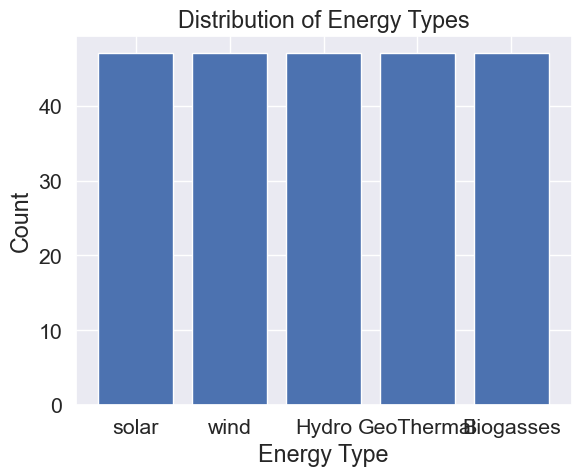

In [377]:
import matplotlib.pyplot as plt

# Plot the count of each Energy_Type
energy_counts = df['Energy_Type'].value_counts()
plt.bar(energy_counts.index, energy_counts.values)
plt.xlabel('Energy Type')
plt.ylabel('Count')
plt.title('Distribution of Energy Types')
plt.show()

In [378]:
# melt the data frame using multiple columns as id_vars
df = df.rename(columns={'TIME': 'Country'})
melted_df = pd.melt(df, id_vars=['Country', 'Energy_Type'], var_name='Year', value_name='MW of electricity')

print(melted_df)
melted_df.head(100)



                                                Country Energy_Type  Year  \
0                                          GEO (Labels)       solar  1990   
1             European Union - 27 countries (from 2020)       solar  1990   
2                  Euro area – 20 countries (from 2023)       solar  1990   
3                                               Belgium       solar  1990   
4                                              Bulgaria       solar  1990   
...                                                 ...         ...   ...   
7515  Kosovo (under United Nations Security Council ...   Biogasses  2021   
7516                                            Georgia   Biogasses  2021   
7517                                                NaN   Biogasses  2021   
7518                                      Special value   Biogasses  2021   
7519                                                  :   Biogasses  2021   

     MW of electricity  
0                  NaN  
1                   11  


,Country,Energy_Type,Year,MW of electricity
0,GEO (Labels),solar,1990,NaN
1,European Union - 27 countries (from 2020),solar,1990,11
2,Euro area – 20 countries (from 2023),solar,1990,11
3,Belgium,solar,1990,0
4,Bulgaria,solar,1990,0
...,...,...,...,...
95,European Union - 27 countries (from 2020),Hydro,1990,121430
96,Euro area – 20 countries (from 2023),Hydro,1990,94081
97,Belgium,Hydro,1990,1401
98,Bulgaria,Hydro,1990,1975


In [379]:
df.columns

Index(['Country', '1990', '1991', '1992', '1993', '1994', '1995', '1996',
       '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005',
       '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014',
       '2015', '2016', '2017', '2018', '2019', '2020', '2021', 'Energy_Type'],
      dtype='object')

In [380]:
#using these varabiles we will compare using a Ttest, the MW of electricity used Ireland and United Kingdom across all Energy_types

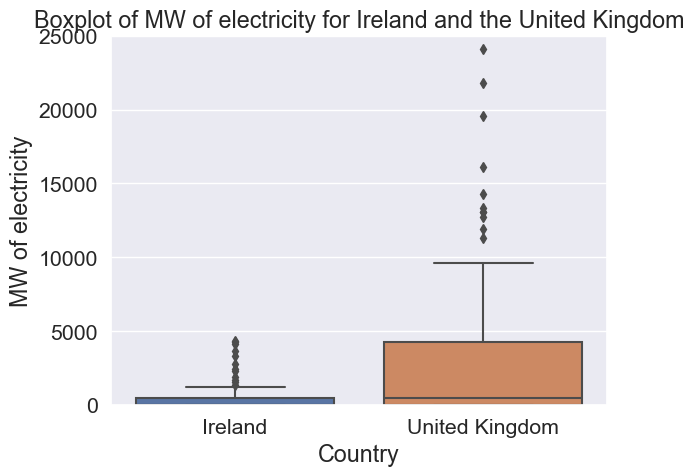

In [381]:
#To understand the scope of the renewable construction sector and its potential we're firs need to understand the consumption and power generation in IE and other countries. here we use UK and IE for example.
import seaborn as sns
import matplotlib.pyplot as plt

# Subset the data frame to include only rows for Ireland and the United Kingdom
country_subset = melted_df[melted_df['Country'].isin(['Ireland', 'United Kingdom'])]

# Convert the MW of electricity column to numeric values
country_subset['MW of electricity'] = pd.to_numeric(country_subset['MW of electricity'], errors='coerce')

# Create a boxplot of the MW of electricity for Ireland and the United Kingdom
sns.boxplot(x='Country', y='MW of electricity', data=country_subset)
plt.title('Boxplot of MW of electricity for Ireland and the United Kingdom')
plt.ylim([0, 25000])  # set y-axis limits

# Display the plot
plt.show()



In [382]:
# Subset the data frame to include only rows for Ireland and the United Kingdom
country_subset = melted_df[melted_df['Country'].isin(['Ireland', 'United Kingdom'])]
country_subset['MW of electricity'] = pd.to_numeric(country_subset['MW of electricity'], errors='coerce')

# Group the subset data frame by Country and Energy_Type and calculate the mean MW of electricity for each combination
grouped_means = country_subset.groupby(['Country', 'Energy_Type'])['MW of electricity'].mean().reset_index()

# Pivot the grouped data frame to have Energy_Type as columns and Country as rows
pivoted_means = grouped_means.pivot(index='Country', columns='Energy_Type', values='MW of electricity')

# Extract the values of the Ireland and UK 
ireland_values = pivoted_means.loc['Ireland'].values
uk_values = pivoted_means.loc['United Kingdom'].values

# Calculate the mean and standard deviation for each country
ireland_mean = pivoted_means.loc['Ireland'].mean()
uk_mean = pivoted_means.loc['United Kingdom'].mean()
ireland_std = pivoted_means.loc['Ireland'].std()
uk_std = pivoted_means.loc['United Kingdom'].std()

# Calculate mean and %CV for each country
ireland_means = pivoted_means.loc['Ireland'].mean()
ireland_cv = pivoted_means.loc['Ireland'].std() / pivoted_means.loc['Ireland'].mean() * 100
uk_means = pivoted_means.loc['United Kingdom'].mean()
uk_cv = pivoted_means.loc['United Kingdom'].std() / pivoted_means.loc['United Kingdom'].mean() * 100

# Conduct a two-sample t-test 
from scipy.stats import ttest_ind
t_stat, p_val = ttest_ind(ireland_values, uk_values, equal_var=False)

# Print the mean, standard deviation, and p-value to the console
print(f"The mean MW of electricity for Ireland is {ireland_mean:.3f} with a standard deviation of {ireland_std:.3f}.")
print(f"The mean MW of electricity for the United Kingdom is {uk_mean:.3f} with a standard deviation of {uk_std:.3f}.")
print(f"\nIreland: Mean MW of electricity: {ireland_means}, %%CV: {ireland_cv:.2f}%%")
print(f"United Kingdom: Mean MW of electricity: {uk_means}, %%CV: {uk_cv:.2f}%%")
print(f"The p-value for the t-test comparing the MW of electricity used in Ireland and the United Kingdom is {p_val:.3f}.")


The mean MW of electricity for Ireland is 353.824 with a standard deviation of 531.370.
The mean MW of electricity for the United Kingdom is 2593.504 with a standard deviation of 2260.847.

Ireland: Mean MW of electricity: 353.82354999999995, %%CV: 150.18%%
United Kingdom: Mean MW of electricity: 2593.5042000000003, %%CV: 87.17%%
The p-value for the t-test comparing the MW of electricity used in Ireland and the United Kingdom is 0.090.


In [383]:
#The data above %cv in particular tell us that the varability for each county is disisimlar- even without further confirmatory analysis. Its 100% larger for Ireland.we will repeat the analysis using a non-parametric test called Mann Whitney which doesnt require the balance of varabiltiy betwenendatasets
# Subset the data frame to include only rows for Ireland and the United Kingdom
country_subset = melted_df[melted_df['Country'].isin(['Ireland', 'United Kingdom'])]
country_subset['MW of electricity'] = pd.to_numeric(country_subset['MW of electricity'], errors='coerce')

# Group the subset data frame by Country and Energy_Type and calculate the mean MW of electricity for each combination
grouped_means = country_subset.groupby(['Country', 'Energy_Type'])['MW of electricity'].mean().reset_index()

# Pivot the grouped data frame to have Energy_Type as columns and Country as rows
pivoted_means = grouped_means.pivot(index='Country', columns='Energy_Type', values='MW of electricity')

# Extract the values of the Ireland and UK 
ireland_values = pivoted_means.loc['Ireland'].values
uk_values = pivoted_means.loc['United Kingdom'].values

# Calculate the mean and standard deviation for each country
ireland_mean = pivoted_means.loc['Ireland'].mean()
uk_mean = pivoted_means.loc['United Kingdom'].mean()
ireland_std = pivoted_means.loc['Ireland'].std()
uk_std = pivoted_means.loc['United Kingdom'].std()

# Calculate mean and %CV for each country
ireland_means = pivoted_means.loc['Ireland'].mean()
ireland_cv = pivoted_means.loc['Ireland'].std() / pivoted_means.loc['Ireland'].mean() * 100
uk_means = pivoted_means.loc['United Kingdom'].mean()
uk_cv = pivoted_means.loc['United Kingdom'].std() / pivoted_means.loc['United Kingdom'].mean() * 100

# Conduct a two-sample Mann-Whitney U test 
from scipy.stats import mannwhitneyu
u_stat, p_val = mannwhitneyu(ireland_values, uk_values, alternative='two-sided')

# Print the mean, standard deviation, and p-value to the console
print(f"The mean MW of electricity for Ireland is {ireland_mean:.3f} with a standard deviation of {ireland_std:.3f}.")
print(f"The mean MW of electricity for the United Kingdom is {uk_mean:.3f} with a standard deviation of {uk_std:.3f}.")
print(f"\nIreland: Mean MW of electricity: {ireland_means}, %%CV: {ireland_cv:.2f}%%")
print(f"United Kingdom: Mean MW of electricity: {uk_means}, %%CV: {uk_cv:.2f}%%")
print(f"The p-value for the Mann-Whitney U test comparing the MW of electricity used in Ireland and the United Kingdom is {p_val:.3f}.")


The mean MW of electricity for Ireland is 353.824 with a standard deviation of 531.370.
The mean MW of electricity for the United Kingdom is 2593.504 with a standard deviation of 2260.847.

Ireland: Mean MW of electricity: 353.82354999999995, %%CV: 150.18%%
United Kingdom: Mean MW of electricity: 2593.5042000000003, %%CV: 87.17%%
The p-value for the Mann-Whitney U test comparing the MW of electricity used in Ireland and the United Kingdom is 0.173.


In [384]:

#The p-value of 0.173 suggests that there is not enough evidence to reject the null hypothesis that the amount of electricity produced from renewables in Ireland and the United Kingdom are equal. The test did not find a significant difference between the two countries at 0.05 alpha 95% Confidence.
#This test offers a more robust analysis than the previous t-test which was boderline significnace i.e if alpha was 0.1. 

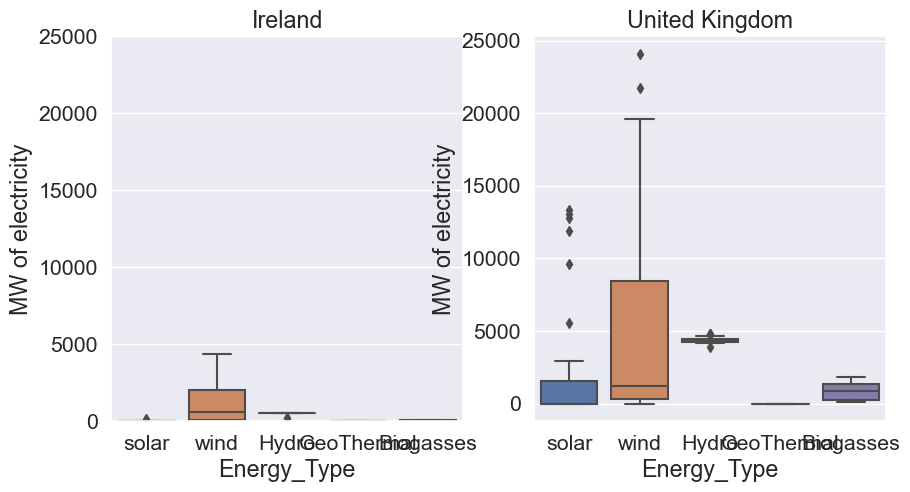

In [385]:
#To understand the exisiting scope of the renewable construction industry in IReland and UK, the various renewable construction sectors are listed below
import seaborn as sns
import matplotlib.pyplot as plt

# Subset the data frame to include only rows for Ireland and the United Kingdom
country_subset = melted_df[melted_df['Country'].isin(['Ireland', 'United Kingdom'])]

# Convert the MW of electricity column to numeric values
country_subset['MW of electricity'] = pd.to_numeric(country_subset['MW of electricity'], errors='coerce')

# Create two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 5))

# Plot the boxplot for Ireland on the first subplot
sns.boxplot(x='Energy_Type', y='MW of electricity', data=country_subset[country_subset['Country'] == 'Ireland'], ax=ax1)
ax1.set_title('Ireland')
ax1.set_ylim([0, 25000])  # set y-axis limits
# Plot the boxplot for the United Kingdom on the second subplot
sns.boxplot(x='Energy_Type', y='MW of electricity', data=country_subset[country_subset['Country'] == 'United Kingdom'], ax=ax2)
ax2.set_title('United Kingdom')
ax1.set_ylim([0, 25000])  # set y-axis limits
# Display the plots
plt.show()


In [386]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Subset the data frame to include only rows for Ireland and the United Kingdom
country_subset1 = melted_df[melted_df['Country'].isin(['Ireland', 'United Kingdom'])]
country_subset['MW of electricity'] = pd.to_numeric(country_subset['MW of electricity'], errors='coerce')

# Fit the ANOVA model using the formula interface
model = ols('Q("MW of electricity") ~ C(Country) + C(Energy_Type) + C(Country):C(Energy_Type)', data=country_subset).fit()

# Print the ANOVA table
table = sm.stats.anova_lm(model, typ=2)
print(table)


                                 sum_sq     df          F        PR(>F)
C(Country)                 3.883486e+08    1.0  52.000420  4.540053e-12
C(Energy_Type)             4.457255e+08    4.0  14.920819  3.919969e-11
C(Country):C(Energy_Type)  2.037872e+08    4.0   6.821849  2.879571e-05
Residual                   2.240455e+09  300.0        NaN           NaN


In [387]:
#carry out an ANOVA of all thoe coutries by energy type and renewable power production
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Subset the data frame to exclude rows for 'European Union - 27 countries (from 2020)' and 'Euro area – 20 countries (from 2023)'
exclude_countries = ['European Union - 27 countries (from 2020)', 'Euro area – 20 countries (from 2023)']
country_subset = melted_df[~melted_df['Country'].isin(exclude_countries)]
country_subset['MW of electricity'] = pd.to_numeric(country_subset['MW of electricity'], errors='coerce')

# Fit the ANOVA model using the formula interface
model = ols('Q("MW of electricity") ~ C(Country) + C(Energy_Type) + C(Country):C(Energy_Type)', data=country_subset).fit()

# Print the ANOVA table
table = sm.stats.anova_lm(model, typ=2)
print(table)



                                 sum_sq      df           F    PR(>F)
C(Country)                 3.034887e+11    43.0  938.872691  0.000000
C(Energy_Type)            -5.110474e+02     4.0   -0.000017  1.000000
C(Country):C(Energy_Type)  3.281601e+08   172.0    0.253799  0.614432
Residual                   4.330020e+10  5760.0         NaN       NaN


In [388]:
#Notes for Del: n ANOVA, there are different methods for partitioning the variation in the response variable into components that can be attributed to different sources of variation. The three most common methods are Type I, Type II, and Type III sums of squares.#Type I sums of squares (SS) consider the contribution of each variable in the model in the order they are specified, and control for the previous variables in the model. Type II SS consider the contribution of each variable while simultaneously controlling for all other variables in the model, and Type III SS consider the contribution of each variable while controlling for all other variables including their interaction terms.#The choice of the type of SS method used can impact the ANOVA results and conclusions, especially when there are interactions among variables. When there are interactions, the main effects may not be significant in Type II or Type III SS ANOVA, while they may be significant in Type I SS ANOVA.#In your case, it appears that Type I SS ANOVA is showing significant differences, while Type II and Type III SS ANOVA are not. This may be due to the specific model you are using and the presence of interactions among variables. It is important to consider the context of your analysis and the specific research question you are trying to answer when selecting a SS method.#The code table = sm.stats.anova_lm(model, typ=1) computes an ANOVA table for the fitted linear regression model model using Type I SS method. The resulting table object is a pandas DataFrame that shows the sum of squares, degrees of freedom, mean square, F-statistic, and p-value for each source of variation in the model. You can use this table to evaluate the significance of each variable and interaction term in the model.


In [389]:
#Compare the mw of power generated per member state and use KW test to determine significant of the differences 
from scipy.stats import kruskal

# Subset the data frame to exclude rows for 'European Union - 27 countries (from 2020)' and 'Euro area – 20 countries (from 2023)'
exclude_countries = ['European Union - 27 countries (from 2020)', 'Euro area – 20 countries (from 2023)']
country_subset = melted_df[~melted_df['Country'].isin(exclude_countries)]
country_subset['MW of electricity'] = pd.to_numeric(country_subset['MW of electricity'], errors='coerce')

# Convert the 'MW of electricity' column to numeric and drop rows with missing values
country_subset['MW of electricity'] = pd.to_numeric(country_subset['MW of electricity'], errors='coerce')
country_subset.dropna(subset=['MW of electricity'], inplace=True)

# Perform Kruskal-Wallis test
statistic, p_value = kruskal(*[group['MW of electricity'] for name, group in country_subset.groupby(['Country', 'Energy_Type'])])

# Print the results
print('Kruskal-Wallis Test Results:')
print('-----------------------------')
print(f'Statistic: {statistic:.4f}')
print(f'p-value: {p_value:.4f}')




Kruskal-Wallis Test Results:
-----------------------------
Statistic: 4297.1072
p-value: 0.0000


In [390]:
#Delete_The Kruskal-Wallis test is a non-parametric test used to determine whether two or more independent samples come from populations with the same distribution. The test statistic for the Kruskal-Wallis test is denoted by H and measures the degree of difference among the groups. The p-value associated with the test measures the evidence against the null hypothesis of no difference in population medians.In your case, the Kruskal-Wallis test statistic is 4680.6083 and the p-value is 0.0000. This means that there is strong evidence to reject the null hypothesis that the medians of the energy production levels are the same across all countries and energy types. In other words, there is a significant difference in energy production levels between the different countries and energy types.

In [391]:
#France is a nuclear power, and earlier analysis outlines that the tradjectory for renewables is differnt to Ie. The Mann-Whitney U test results show a statistic of 9104.5 and a p-value of 6.151025627292879e-06. This indicates that there is a significant difference between the two groups being compared, and the null hypothesis can be rejected. The p-value being less than the alpha level of 0.05 suggests that the probability of obtaining such a result by chance is very low. Therefore, we can conclude that the difference between the two groups is statistically significant.

In [392]:
import numpy as np
melted_df[melted_df['MW of electricity'] == ':']
#melted_df = melted_df.dropna(subset=['MW of electricity'], axis=0)
melted_df = melted_df.dropna(subset=['MW of electricity'], axis=0)


In [393]:
import pandas as pd
import plotly.express as px

melted_df = melted_df[pd.to_numeric(melted_df['MW of electricity'], errors='coerce').notnull()]
melted_df['Year'] = melted_df['Year'].astype(float)
melted_df['MW of electricity'] = melted_df['MW of electricity'].astype(float)

xmin, xmax = min(melted_df.Year), max(melted_df.Year)
ymin, ymax = min(melted_df['MW of electricity']), max(melted_df['MW of electricity'])

fig = px.scatter(melted_df, x="Year", y="MW of electricity", animation_frame="Year",
                 animation_group="Country", color="Energy_Type", hover_name="Energy_Type",
                 range_x=[xmin, xmax], range_y=[ymin, ymax],
                 size="MW of electricity", size_max=45, log_x=True)

fig.update_layout(
    title="MW of Renewable Power Output in EU MSs per Energy Type",
    xaxis_title="Year",
    yaxis_title="MW of Electricity"
)

fig.show()


In [394]:
#carry out the MannWhitney comparing IE and FR by mw of electiricty 
from scipy.stats import mannwhitneyu

# Subset the data frame to include only rows for Ireland and the United Kingdom
country_subset = melted_df[melted_df['Country'].isin(['Ireland', 'France'])]

# Perform Mann-Whitney U test
statistic, p_value = mannwhitneyu(country_subset[country_subset['Country'] == 'Ireland']['MW of electricity'], 
                                  country_subset[country_subset['Country'] == 'France']['MW of electricity'])

# Print the results
print("Mann-Whitney U Test Results:")
print("----------------------------")
print("Statistic:", statistic)
print("p-value:", p_value)


Mann-Whitney U Test Results:
----------------------------
Statistic: 9104.5
p-value: 6.151025627292879e-06


In [395]:
import pandas as pd
import numpy as np
import plotly.express as px

# Assuming 'melted_df' is your DataFrame containing the data

melted_df['Year'] = melted_df['Year'].astype(float)

fig = px.scatter(melted_df, x="Year", y="Energy_Type", animation_frame="Year",
                 animation_group="Energy_Type", size="MW of electricity", color="Country",
                 hover_name="Energy_Type", range_x=[min(melted_df['Year']), max(melted_df['Year'])],
                 log_x=True, size_max=55)

fig.update_layout(
    title="MW of Renewable Power Output in MS per Energy Type",
    xaxis_title="Year",
    yaxis_title="Energy Type"
)

fig.show()



In [396]:
import pandas as pd
import numpy as np
import plotly.express as px

melted_df['Year'] = melted_df['Year'].astype(float)

fig = px.scatter(melted_df, x="Year", y="Country", animation_frame="Year",
                 animation_group="Country", size="MW of electricity", color="Energy_Type",
                 hover_name="Energy_Type",
                 range_x=[min(melted_df['Year']), max(melted_df['Year'])],
                 log_x=True, size_max=55)

fig.update_traces(mode='markers', marker=dict(sizemode='diameter', sizeref=1))

# Sort the data in descending order of MW of output
melted_df_sorted = melted_df.sort_values(by='MW of electricity', ascending=False)

fig.update_layout(
    yaxis=dict(categoryarray=melted_df_sorted['Country'].tolist(), autorange='reversed')
)

fig.show()



In [397]:
#animated visuilisation of the various renewable energy capacities in Europe from 1990 to 2021
import pandas as pd
import numpy as np
import plotly.express as px 

xmin, xmax = min(melted_df.Year), max(melted_df.Year)
ymin, ymax = min(melted_df['MW of electricity']), max(melted_df['MW of electricity'])# Convert MW of electricity to float

melted_df['MW of electricity'] = melted_df['MW of electricity'].astype(float)

fig = px.scatter(melted_df, x="Year", y="Country", animation_frame="Year",
                 animation_group="Country", size="MW of electricity", color="Energy_Type", hover_name="Energy_Type",
                 range_x=[min(melted_df.Year), max(melted_df.Year)], log_x=True, size_max=100, width=1800, height=1600)

fig.show()

In [398]:
import pandas as pd
import numpy as np
import plotly.express as px

# filter data to show only solar energy
solar_df = melted_df[melted_df['Energy_Type'] == 'solar']

# convert year column to float
solar_df['Year'] = solar_df['Year'].astype(float)

# create scatter plot with size of bubbles based on MW of electricity and color of bubbles based on country
fig = px.scatter(solar_df, x="Year", y="Country", animation_frame="Year",
                 animation_group="Country", size="MW of electricity", color="Energy_Type", hover_name="Energy_Type",
                 range_x=[min(solar_df.Year), max(solar_df.Year)], log_x=True, size_max=55)

fig.show()


In [399]:
#MW of electricity produced from the main sources of renewable energy produced in Ireland between 1990 and 2021.
# filter the dataframe to select only data for Ireland and all 5 energy types
ireland_df = melted_df[(melted_df.Country == "Ireland")]

# convert the Year column to float
ireland_df['Year'] = ireland_df['Year'].astype(float)

# create the scatter plot
fig = px.scatter(ireland_df, x="Year", y="Energy_Type", animation_frame="Year",
                 animation_group="Energy_Type", size="MW of electricity", color="MW of electricity", hover_name="Energy_Type",
                 range_x=[min(ireland_df.Year), max(ireland_df.Year)], log_x=True, size_max=55)

fig.show()

In [400]:
#Here a forcasting model will be built to forcast the likely tradjectory of renewable energy use and a proxy foe construction output in the EU over the next 2 years.

In [401]:
melted_df.columns

Index(['Country', 'Energy_Type', 'Year', 'MW of electricity'], dtype='object')

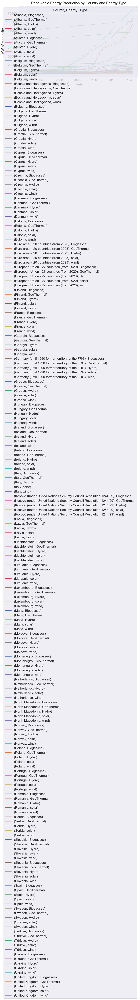

In [402]:
#plotting some time series line graphs to see the various trends in the data. This is quite noisey.
import matplotlib.pyplot as plt
melted_df.reset_index(inplace=True)
# Set the 'Year' column as the index of the DataFrame
melted_df.set_index('Year', inplace=True)

# Create a pivot table to aggregate the 'MW of electricity' values by 'Country' and 'Energy_Type'
pivot_df = melted_df.pivot_table(values='MW of electricity', index=melted_df.index, columns=['Country', 'Energy_Type'], aggfunc='sum')

# Plot the time series for each 'Country' and 'Energy_Type'
pivot_df.plot(figsize=(10,6), title='Renewable Energy Production by Country and Energy Type')
plt.ylabel('MW of electricity')
plt.show()

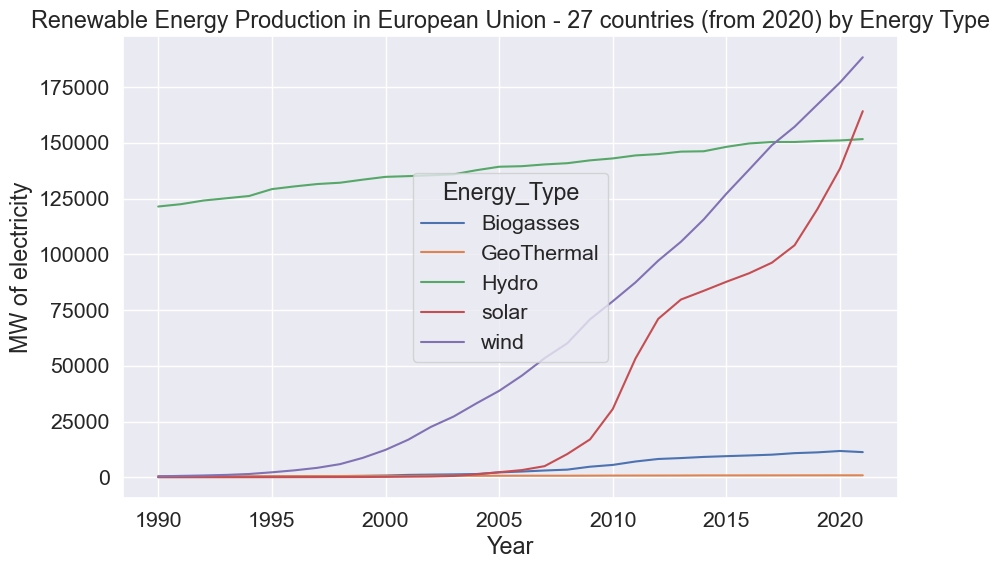

Dropdown(description='Select a country', options=('European Union - 27 countries (from 2020)', 'Euro area – 20…

In [403]:
#The above visual is too noisey and not good to look at. Here we will try to empoy a dashboard to make the interpretation easier for the end user to interpret.
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ipywidgets as widgets
from IPython.display import display
import numpy as np

# Extract unique countries from the 'Country' column
countries = melted_df['Country'].unique()

# Create a dropdown widget to select a country
country_dropdown = widgets.Dropdown(options=countries, description='Select a country')

# Define a function to create a pivot table and plot the time series for the selected country
def plot_country(country):
    # Filter the DataFrame to include only rows for the selected country
    country_df = melted_df[melted_df['Country'] == country]
    
    # Create a pivot table to aggregate the 'MW of electricity' values by 'Energy_Type'
    pivot_df = country_df.pivot_table(values='MW of electricity', index=country_df.index, columns='Energy_Type', aggfunc='sum')

    # Plot the time series for each 'Energy_Type'
    pivot_df.plot(figsize=(10,6), title=f'Renewable Energy Production in {country} by Energy Type')
    plt.ylabel('MW of electricity')
    plt.show()

# Call the function to plot the time series for the default country
plot_country(countries[0])

# Define a function to update the plot when a new country is selected
def update_plot(change):
    country = change.new
    plot_country(country)

# Link the dropdown widget to the update function
country_dropdown.observe(update_plot, 'value')

# Display the dropdown widget
display(country_dropdown)



In [404]:
#!pip install voila 

In [405]:
#jupyter serverextension enable voila --sys-prefix
#jupyter labextension install @jupyter-widgets/jupyterlab-manager voila

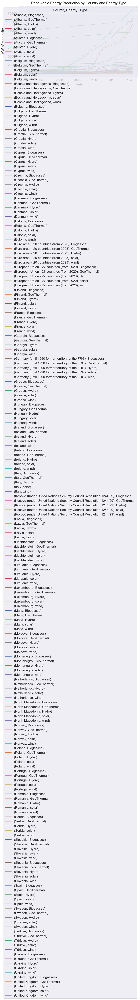

In [411]:
#plotting some time series line graphs to see the various trends in the data. This is quite noisey.
import matplotlib.pyplot as plt
melted_df.reset_index(inplace=True)
# Set the 'Year' column as the index of the DataFrame
melted_df.set_index('Year', inplace=True)

# Create a pivot table to aggregate the 'MW of electricity' values by 'Country' and 'Energy_Type'
pivot_df = melted_df.pivot_table(values='MW of electricity', index=melted_df.index, columns=['Country', 'Energy_Type'], aggfunc='sum')

# Plot the time series for each 'Country' and 'Energy_Type'
pivot_df.plot(figsize=(10,6), title='Renewable Energy Production by Country and Energy Type')
plt.ylabel('MW of electricity')
plt.show()


In [412]:
import matplotlib.pyplot as plt
import plotly.tools as tls
import plotly.graph_objs as go

# Set the 'Year' column as the index of the DataFrame
#melted_df.set_index('Year', inplace=True)

# Create a pivot table to aggregate the 'MW of electricity' values by 'Country' and 'Energy_Type'
pivot_df = melted_df.pivot_table(values='MW of electricity', index=melted_df.index, columns=['Country', 'Energy_Type'], aggfunc='sum')

# Plot the time series for each 'Country' and 'Energy_Type' using matplotlib
fig, ax = plt.subplots(figsize=(10,6))
pivot_df.plot(ax=ax, title='Renewable Energy Production by Country and Energy Type')
ax.set_ylabel('MW of electricity')

# Convert the matplotlib plot to an interactive plotly plot
plotly_fig = tls.mpl_to_plotly(fig)

# Add plotly layout options to the figure
plotly_fig.update_layout(title='Renewable Energy Production by Country and Energy Type (Interactive)', xaxis_title='Year', yaxis_title='MW of electricity')

# Show the plotly plot
plotly_fig.show()



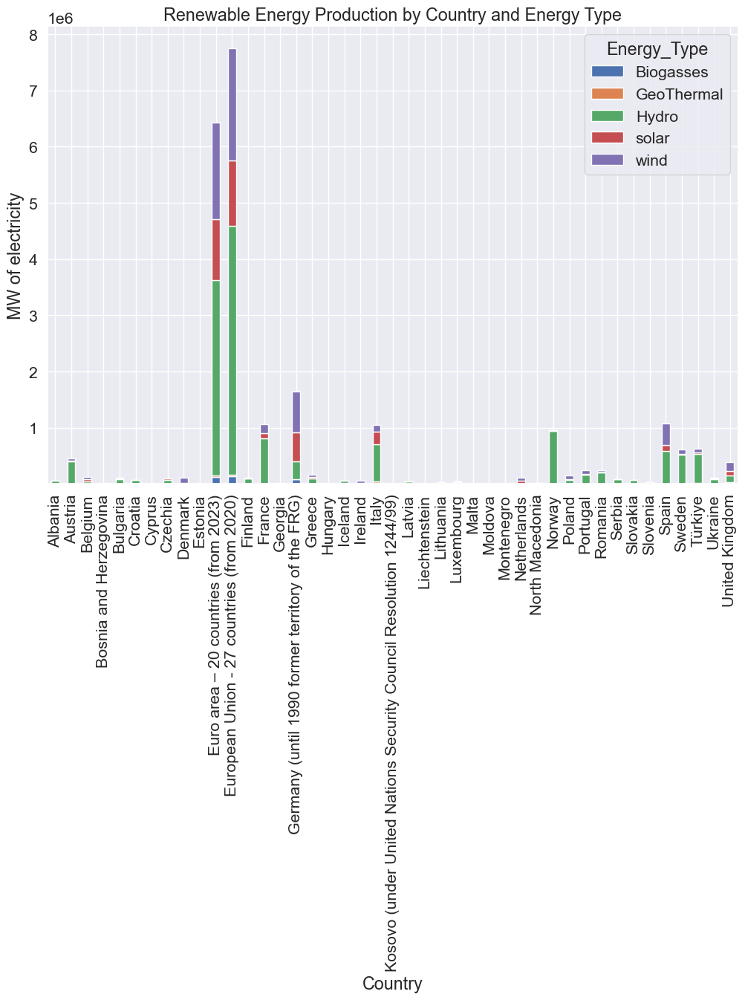

In [413]:
#using a stacked barchat to interpret the data in a more useable way:
import seaborn as sns

# Group the data by country and energy type and sum the MW of electricity
grouped_df = melted_df.groupby(['Country', 'Energy_Type'])['MW of electricity'].sum().reset_index()

# Create a pivot table with the Country as the index, Energy_Type as the columns, and MW of electricity as the values
pivot_df = grouped_df.pivot(index='Country', columns='Energy_Type', values='MW of electricity')

# Plot a stacked bar chart with the pivot table
pivot_df.plot(kind='bar', stacked=True, figsize=(12,8))

# Set the title and axis labels
plt.title('Renewable Energy Production by Country and Energy Type')
plt.xlabel('Country')
plt.ylabel('MW of electricity')

# Show the plot
plt.show()


In [414]:
#This interactive graph allows the selection and investigation of the various countries and their energy production from renewables
import plotly.express as px

# Create a pivot table to aggregate the 'MW of electricity' values by 'Country' and 'Energy_Type'
pivot_df = melted_df.pivot_table(values='MW of electricity', index=melted_df.index, columns=['Country', 'Energy_Type'], aggfunc='sum')

# Convert the pivot table to a long format DataFrame with columns for 'Year', 'Country', 'Energy_Type', and 'MW of electricity'
long_df = pivot_df.stack(['Country', 'Energy_Type']).reset_index(name='MW of electricity')

# Create an interactive line chart with Plotly
fig = px.line(long_df, x='Year', y='MW of electricity', color='Country', line_group='Energy_Type', title='Renewable Energy Production by Country and Energy Type')
fig.update_layout(xaxis_title='Year', yaxis_title='MW of electricity')
fig.show()


In [417]:
melted_df.reset_index(inplace=True)
#melted_df.set_index('Year', inplace=True)
melted_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6285 entries, 0 to 6284
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               6285 non-null   float64
 1   index              6285 non-null   int64  
 2   Country            6285 non-null   object 
 3   Energy_Type        6285 non-null   object 
 4   MW of electricity  6285 non-null   float64
dtypes: float64(2), int64(1), object(2)
memory usage: 245.6+ KB


Text(0.5, 1.0, 'Current and predicted renewable energy production in Ireland')

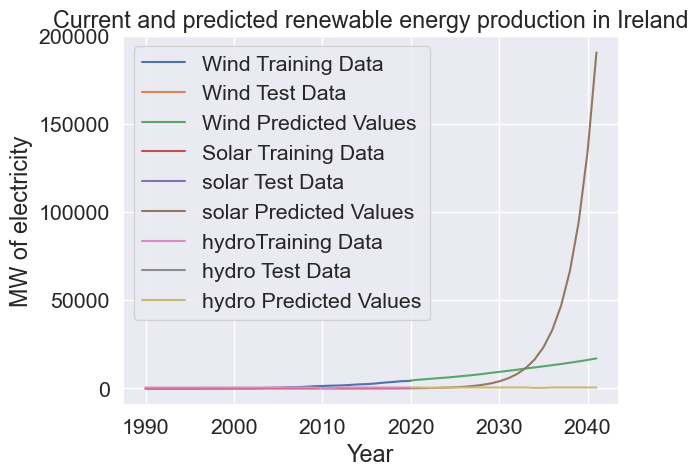

In [422]:
#To understand how important this this reltively new construction sector is forecasting together with other renewables. Similar to forecasting results carried out by IEA 2050 road map.
#Irelands current consumption is 30000000 MWh of electricity Source: https://www.worlddata.info/europe/ireland/energy-consumption.php 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Convert the 'Year' column to a datetime data type
melted_df['Year'] = pd.to_datetime(melted_df['Year'], format='%Y')

# Create a pivot table to aggregate the 'MW of electricity' values by 'Country' and 'Energy_Type'
pivot_df = melted_df.pivot_table(values='MW of electricity', index=melted_df['Year'], columns=['Country', 'Energy_Type'], aggfunc='sum')

# Select a single time series to model
ts_wind = pivot_df['Ireland']['wind']
ts_solar = pivot_df['Ireland']['solar']
ts_hydro = pivot_df['Ireland']['Hydro']


# Train/test split
train_wind = ts_wind[:'2020']
test_wind = ts_wind['2021':]

train_solar = ts_solar[:'2020']
test_solar = ts_solar['2021':]

train_hydro = ts_hydro[:'2020']
test_hydro = ts_hydro['2021':]

# Fit the SARIMA model
model_wind = SARIMAX(train_wind, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_wind = model_wind.fit()

model_solar = SARIMAX(train_solar, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_solar = model_solar.fit()

model_hydro = SARIMAX(train_hydro, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_hydro = model_hydro.fit()

# Convert the date strings to datetime objects
start_date = pd.to_datetime('2020-01-01')
end_date = pd.to_datetime('2040-12-01')

# Make predictions on the test set
preds_wind = results_wind.predict(start=start_date, end=end_date, dynamic=True)
preds_solar = results_solar.predict(start=start_date, end=end_date, dynamic=True)
preds_hydro = results_hydro.predict(start=start_date, end=end_date, dynamic=True)


# Plot the actual and predicted values
plt.plot(train_wind.index, train_wind.values, label='Wind Training Data')
plt.plot(test_wind.index, test_wind.values, label='Wind Test Data')
plt.plot(preds_wind.index, preds_wind.values, label='Wind Predicted Values')
plt.legend()
plt.plot(train_solar.index, train_solar.values, label='Solar Training Data')
plt.plot(test_solar.index, test_solar.values, label='solar Test Data')
plt.plot(preds_solar.index, preds_solar.values, label='solar Predicted Values')
plt.legend()
plt.plot(train_hydro.index, train_hydro.values, label='hydroTraining Data')
plt.plot(test_hydro.index, test_hydro.values, label='hydro Test Data')
plt.plot(preds_hydro.index, preds_hydro.values, label='hydro Predicted Values')
plt.legend()

plt.xlabel('Year')
plt.ylabel('MW of electricity')
plt.title('Current and predicted renewable energy production in Ireland')


In [434]:
#tart back here! The SARIMAX model itself does not provide an accuracy score as a built-in metric. SARIMAX is a time series forecasting model that estimates the parameters of a seasonal autoregressive integrated moving average (SARIMA) model with exogenous variables.
#To evaluate the accuracy of a SARIMAX model, you can use different evaluation metrics such as Mean Absolute Error (MAE), Mean Squared Error (MSE), Root Mean Squared Error (RMSE), or Mean Absolute Percentage Error (MAPE). These metrics compare the predicted values to the actual values and provide a measure of the model's performance.
#You can calculate these metrics by comparing the predicted values from the SARIMAX model to the actual values from the test set. The choice of which metric to use depends on the specific requirements and characteristics of your problem.

# Calculate the mean absolute percentage error (MAPE)
def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate the MAPE for wind
mape_wind = calculate_mape(test_wind, preds_wind)

# Calculate the MAPE for solar
mape_solar = calculate_mape(test_solar, preds_solar)

# Calculate the MAPE for hydro
mape_hydro = calculate_mape(test_hydro, preds_hydro)

# Print the prediction scores
print("Prediction Scores:")
print("Wind MAPE:", mape_wind)
print("Solar MAPE:", mape_solar)
print("Hydro MAPE:", mape_hydro)


Prediction Scores:
Wind MAPE: 15.274681880169766
Solar MAPE: 6.779853850254555
Hydro MAPE: 0.757133031718902


In [431]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_percentage_error

# Convert the 'Year' column to a datetime data type
melted_df['Year'] = pd.to_datetime(melted_df['Year'], format='%Y')

# Create a pivot table to aggregate the 'MW of electricity' values by 'Country' and 'Energy_Type'
pivot_df = melted_df.pivot_table(values='MW of electricity', index=melted_df['Year'], columns=['Country', 'Energy_Type'], aggfunc='sum')

# Select a single time series to model
ts_wind = pivot_df['Ireland']['wind']
ts_solar = pivot_df['Ireland']['solar']
ts_hydro = pivot_df['Ireland']['Hydro']

# Train/test split
train_wind = ts_wind[:'2020']
test_wind = ts_wind['2021':]

train_solar = ts_solar[:'2020']
test_solar = ts_solar['2021':]

train_hydro = ts_hydro[:'2020']
test_hydro = ts_hydro['2021':]

# Fit the SARIMA model
model_wind = SARIMAX(train_wind, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_wind = model_wind.fit()

model_solar = SARIMAX(train_solar, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_solar = model_solar.fit()

model_hydro = SARIMAX(train_hydro, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_hydro = model_hydro.fit()

# Convert the date strings to datetime objects
start_date = pd.to_datetime('2020-01-01')
end_date = pd.to_datetime('2040-12-01')

# Make predictions on the test set
preds_wind = results_wind.predict(start=start_date, end=end_date, dynamic=True)
preds_solar = results_solar.predict(start=start_date, end=end_date, dynamic=True)
preds_hydro = results_hydro.predict(start=start_date, end=end_date, dynamic=True)

# Calculate the mean absolute percentage error (MAPE)
mape_wind = mean_absolute_percentage_error(test_wind, preds_wind)
mape_solar = mean_absolute_percentage_error(test_solar, preds_solar)
mape_hydro = mean_absolute_percentage_error(test_hydro, preds_hydro)

# Calculate the accuracy score
accuracy_wind = 100 - mape_wind
accuracy_solar = 100 - mape_solar
accuracy_hydro = 100 - mape_hydro

# Print the prediction scores
print("Prediction Scores:")
print("Wind MAPE:", mape_wind)
print("Wind Accuracy:", accuracy_wind)
print("Solar MAPE:", mape_solar)
print("Solar Accuracy:", accuracy_solar)
print("Hydro MAPE:", mape_hydro)
print("Hydro Accuracy:", accuracy_hydro)

# Plot the actual and predicted values
plt.plot(train_wind.index, train_wind.values, label='Wind Training Data')
plt.plot(test_wind.index, test_wind.values, label='Wind Test Data')
plt.plot(preds_wind.index, preds_wind.values, label='Wind Predicted Values')
plt.legend()

plt.plot(train_solar.index, train_solar.values, label='Solar Training Data')
plt.plot(test_solar.index, test_solar.values, label='Solar Test Data')
plt.plot(preds_solar.index, preds_solar.values, label='Solar Predicted Values')
plt.legend()

plt.plot(train_hydro.index, train_hydro.values, label='Hydro Training Data')
plt.plot(test_hydro.index, test_hydro.values, label='Hydro Test Data')
plt.plot(preds_hydro.index, preds_hydro.values, label='Hydro Predicted Values')
plt.legend()

plt.xlabel('Year')
plt.ylabel('MW of electricity')
plt.title('Current and predicted renewable energy production in Ireland')

plt.show()


ValueError: Found input variables with inconsistent numbers of samples: [1, 22]

In [358]:
#Compare to UK - IE nearest neighbour 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX

#melted_df.reset_index(inplace=True)
# Convert the 'Year' column to a datetime data type
melted_df['Year'] = pd.to_datetime(melted_df['Year'], format='%Y')

# Create a pivot table to aggregate the 'MW of electricity' values by 'Country' and 'Energy_Type'
pivot_df = melted_df.pivot_table(values='MW of electricity', index=melted_df['Year'], columns=['Country', 'Energy_Type'], aggfunc='sum')

# Select a single time series to model
ts_wind = pivot_df['United Kingdom']['wind']
ts_solar = pivot_df['United Kingdom']['solar']
ts_hydro = pivot_df['United Kingdom']['Hydro']


# Train/test split
train_wind = ts_wind[:'2020']
test_wind = ts_wind['2021':]

train_solar = ts_solar[:'2020']
test_solar = ts_solar['2021':]

train_hydro = ts_hydro[:'2020']
test_hydro = ts_hydro['2021':]

# Fit the SARIMA model
model_wind = SARIMAX(train_wind, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_wind = model_wind.fit()

model_solar = SARIMAX(train_solar, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_solar = model_solar.fit()

model_hydro = SARIMAX(train_hydro, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_hydro = model_hydro.fit()

# Convert the date strings to datetime objects
start_date = pd.to_datetime('2020-01-01')
end_date = pd.to_datetime('2040-12-01')

# Make predictions on the test set
preds_wind = results_wind.predict(start=start_date, end=end_date, dynamic=True)
preds_solar = results_solar.predict(start=start_date, end=end_date, dynamic=True)
preds_hydro = results_hydro.predict(start=start_date, end=end_date, dynamic=True)


# Plot the actual and predicted values
plt.plot(train_wind.index, train_wind.values, label='Wind Training Data')
plt.plot(test_wind.index, test_wind.values, label='Wind Test Data')
plt.plot(preds_wind.index, preds_wind.values, label='Wind Predicted Values')
plt.legend()
plt.plot(train_solar.index, train_solar.values, label='Solar Training Data')
plt.plot(test_solar.index, test_solar.values, label='solar Test Data')
plt.plot(preds_solar.index, preds_solar.values, label='solar Predicted Values')
plt.legend()
plt.plot(train_hydro.index, train_hydro.values, label='hydroTraining Data')
plt.plot(test_hydro.index, test_hydro.values, label='hydro Test Data')
plt.plot(preds_hydro.index, preds_hydro.values, label='hydro Predicted Values')
plt.legend()


plt.xlabel('Year')
plt.ylabel('MW of electricity')
plt.title('Current and predicted renewable energy production in UK')



KeyError: 'Year'

In [359]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Assuming test_wind and preds_wind are numpy arrays
mse_wind = mean_squared_error(test_wind, preds_wind)
mae_wind = mean_absolute_error(test_wind, preds_wind)

# Print the evaluation metrics
print("Evaluation Metrics:")
print("Wind - MSE: {}, MAE: {}".format(mse_wind, mae_wind))


ValueError: Found input variables with inconsistent numbers of samples: [1, 22]

Text(0.5, 1.0, 'Current and predicted renewable energy production in France')

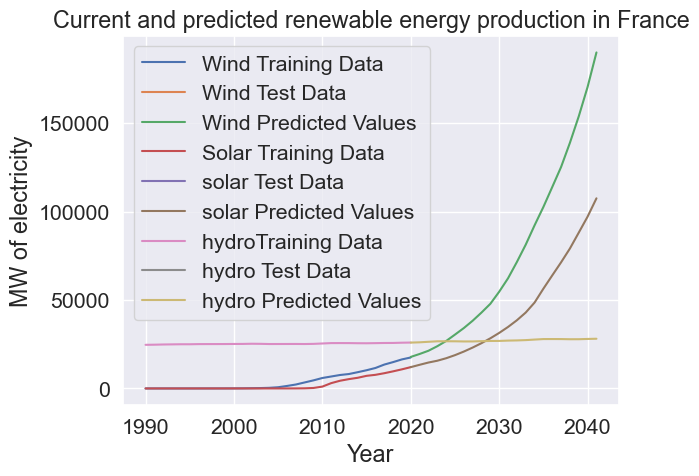

In [300]:
#Compare to France - FR has a heavy reliance on Nuclear power generation and a pipeline of new nuclear projects.
#Although Fr has better sunshine hours than IE, their wind power generation of electricty is forecasted to be more than solar going into 2040.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Convert the 'Year' column to a datetime data type
melted_df['Year'] = pd.to_datetime(melted_df['Year'], format='%Y')

# Create a pivot table to aggregate the 'MW of electricity' values by 'Country' and 'Energy_Type'
pivot_df = melted_df.pivot_table(values='MW of electricity', index=melted_df['Year'], columns=['Country', 'Energy_Type'], aggfunc='sum')

# Select a single time series to model
ts_wind = pivot_df['France']['wind']
ts_solar = pivot_df['France']['solar']
ts_hydro = pivot_df['France']['Hydro']

# Train/test split
train_wind = ts_wind[:'2020']
test_wind = ts_wind['2021':]

train_solar = ts_solar[:'2020']
test_solar = ts_solar['2021':]

train_hydro = ts_hydro[:'2020']
test_hydro = ts_hydro['2021':]

# Fit the SARIMA model
model_wind = SARIMAX(train_wind, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_wind = model_wind.fit()

model_solar = SARIMAX(train_solar, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_solar = model_solar.fit()

model_hydro = SARIMAX(train_hydro, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12), enforce_stationarity=False, enforce_invertibility=False)
results_hydro = model_hydro.fit()

# Convert the date strings to datetime objects
start_date = pd.to_datetime('2020-01-01')
end_date = pd.to_datetime('2040-12-01')

# Make predictions on the test set
preds_wind = results_wind.predict(start=start_date, end=end_date, dynamic=True)
preds_solar = results_solar.predict(start=start_date, end=end_date, dynamic=True)
preds_hydro = results_hydro.predict(start=start_date, end=end_date, dynamic=True)


# Plot the actual and predicted values
plt.plot(train_wind.index, train_wind.values, label='Wind Training Data')
plt.plot(test_wind.index, test_wind.values, label='Wind Test Data')
plt.plot(preds_wind.index, preds_wind.values, label='Wind Predicted Values')
plt.legend()
plt.plot(train_solar.index, train_solar.values, label='Solar Training Data')
plt.plot(test_solar.index, test_solar.values, label='solar Test Data')
plt.plot(preds_solar.index, preds_solar.values, label='solar Predicted Values')
plt.legend()
plt.plot(train_hydro.index, train_hydro.values, label='hydroTraining Data')
plt.plot(test_hydro.index, test_hydro.values, label='hydro Test Data')
plt.plot(preds_hydro.index, preds_hydro.values, label='hydro Predicted Values')
plt.legend()

plt.xlabel('Year')
plt.ylabel('MW of electricity')
plt.title('Current and predicted renewable energy production in France')



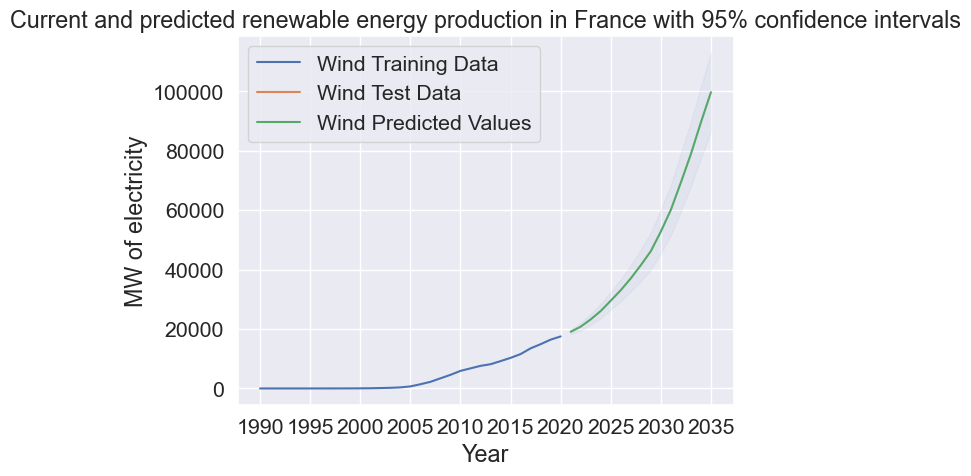

In [301]:
#I want to plot the CI for the predicted yers of data for wind in France:
# Convert the date strings to datetime objects
#I want to plot the CI for the most recent 3 years of data:

# Convert the date strings to datetime objects
start_date = pd.to_datetime('2015-01-01')
end_date = pd.to_datetime('2040-12-01')

# Get the forecast and confidence intervals for the past 3 years
forecast_wind = results_wind.get_forecast(steps=15)


# Extract the predicted values and confidence intervals
preds_wind = forecast_wind.predicted_mean[-10:]
ci_wind = forecast_wind.conf_int(alpha=0.05)[-10:]


#I want to plot the CI for the most recent 3 years of data:

# Convert the date strings to datetime objects
start_date = pd.to_datetime('2020-01-01')
end_date = pd.to_datetime('2040-12-01')

# Get the forecast and confidence intervals for the past 3 years
forecast_wind = results_wind.get_forecast(steps=15)


# Extract the predicted values and confidence intervals
preds_wind = forecast_wind.predicted_mean[-15:]
ci_wind = forecast_wind.conf_int(alpha=0.05)[-15:]

# Plot the actual and predicted values with confidence intervals
plt.plot(train_wind.index, train_wind.values, label='Wind Training Data')
plt.plot(test_wind.index, test_wind.values, label='Wind Test Data')
plt.plot(preds_wind.index, preds_wind.values, label='Wind Predicted Values')
plt.fill_between(ci_wind.index, ci_wind.iloc[:,0], ci_wind.iloc[:,1], color='b', alpha=0.05)

plt.xlabel('Year')
plt.ylabel('MW of electricity')
plt.title('Current and predicted renewable energy production in France with 95% confidence intervals')
plt.legend()
plt.show()



In [ ]:
melted_df.head()

In [302]:
# Extract the predicted values for MW of electricity production and confidence intervals @95% assocaited with these
preds_wind = forecast_wind.predicted_mean[-10:]
ci_wind = forecast_wind.conf_int(alpha=0.05)[-10:]

# Calculate the mean and CI for each data point in the data above
mean_wind = preds_wind.mean()
ci_wind_lower = ci_wind.iloc[:,0].mean()
ci_wind_upper = ci_wind.iloc[:,1].mean()

# Create a table to display the mean and CI values
table_data = {'Data Point': preds_wind.index,
              'Mean': preds_wind.values,
              'CI Lower Bound': ci_wind.iloc[:,0],
              'CI Upper Bound': ci_wind.iloc[:,1]}
table = pd.DataFrame(table_data)

# Format the Mean, CI Lower Bound, and CI Upper Bound 
table = table.applymap(lambda x: '{:.1f}'.format(x) if isinstance(x, (int, float)) else x)

# Add the mean and CI values to the table below
table.loc['Mean'] = ['Mean', mean_wind, '', '']
table.loc['CI'] = ['CI', ci_wind_lower, ci_wind_upper, '']

# Display the table
print(table)


                              Data Point          Mean CI Lower Bound  \
2026-01-01 00:00:00  2026-01-01 00:00:00       33089.1        29395.5   
2027-01-01 00:00:00  2027-01-01 00:00:00       37058.0        32596.6   
2028-01-01 00:00:00  2028-01-01 00:00:00       41491.4        36175.7   
2029-01-01 00:00:00  2029-01-01 00:00:00       46233.4        39967.1   
2030-01-01 00:00:00  2030-01-01 00:00:00       52823.3        45499.6   
2031-01-01 00:00:00  2031-01-01 00:00:00       60154.4        51655.5   
2032-01-01 00:00:00  2032-01-01 00:00:00       69348.0        59543.5   
2033-01-01 00:00:00  2033-01-01 00:00:00       78941.6        68061.7   
2034-01-01 00:00:00  2034-01-01 00:00:00       89609.7        77540.3   
2035-01-01 00:00:00  2035-01-01 00:00:00       99727.6        86342.5   
Mean                                Mean  60847.657138                  
CI                                    CI  52677.789693   69017.524582   

                    CI Upper Bound  
2026-01-01 00

In [ ]:
#Moving onto the use of ML model for the purpose of forcasting similar to above. Regression is ideal here so SV ML will be used.
# group the data by year and energy type and calculate the sum of MW of electricity generated by each type of energy in each year
#On attempting ML (SVM) for this time series data i realise that SVM is not ideal as the model expects the varabiles to be independant of each other and the temporal nature of this time series data breaches that. 
#I will move to carrying out ML modelling on predicitions of electrivty production from the new constructtion matrials in the sloar space. 
#End.



In [ ]:
#!pip install -U kaleido
#Experimenting trying to extrat only the graphs to date for the report 

In [ ]:
import os
import plotly.io as pio

# Define the path to the folder where the figures will be saved
folder_path = 'D:/CA2_figs'

# Save all figures in notebook to folder as PNG files
figures = [fig for fig in plt.get_fignums()]
for i, fig in enumerate(figures):
    # Extract the figure name from the title of the figure
    fig_title = fig['layout']['title']['text']
    print(f'fig_title: {fig_title}')
    fig_name = fig_title.split(':')[0]
    print(f'fig_name: {fig_name}')
    
    file_path = os.path.join(folder_path, f'{fig_name}_{i+1}.png')
    pio.write_image(fig, file_path)




In [ ]:
import os
import plotly.io as pio

# Define the path to the folder where the figures will be saved
folder_path = 'D:/CA2_figs'

# Get all figures in the notebook
figures = []
for i, template_name in enumerate(sorted(list(pio.templates.keys()))):
    try:
        fig = pio.to_json(pio.templates[template_name])
        figures.append(fig)
    except Exception as e:
        print(f'Error encountered with template {template_name}: {e}')

# Print the number of figures found
print(f'{len(figures)} figures found')

# Save all figures in notebook to folder as PNG files
for i, fig in enumerate(figures):
    # Extract the figure name from the title of the figure
    fig_title = fig['layout']['title']['text']
    fig_name = fig_title.split(':')[0]
    
    file_path = os.path.join(folder_path, f'{fig_name}_{i+1}.png')
    pio.write_image(fig, file_path)




In [ ]:
#Create folder on D drive to house plots.
import os
os.makedirs('D:/plots', exist_ok=True)

In [ ]:
#Extract the plots so far onto the D drive for implemention on the report.
import nbformat
from IPython.display import display, HTML
import base64

# Load the notebook file
nb = nbformat.read('CA2_Noteboook.ipynb', as_version=4)

# Find all output cells and extract image data
for i, cell in enumerate(nb.cells):
    if cell.get('outputs'):
        for j, output in enumerate(cell.outputs):
            if output.output_type == 'display_data':
                # Extract PNG data from image data
                if 'image/png' in output.data:
                    png_data = output.data['image/png']
                    # Save the PNG data to a file
                    with open(f'D:/plots/plot_{i}_{j}.png', 'wb') as f:
                        f.write(base64.b64decode(png_data))
                    # Display the PNG image in the notebook
                    display(HTML(f'<img src="data:image/png;base64,{png_data}" />'))




In [ ]:
#David then kindly showed us a way to produce a pdf from HTML so i've done that instead and its much handier. 

Here is the licence conditions to use the API for the photovoltaic access of the JRC.

Copyright (c) 2019, Stian Hanger

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

MIT License
A short and simple permissive license with conditions only requiring preservation of copyright and license notices. Licensed works, modifications, and larger works may be distributed under different terms and without source code.

Permissions
 Commercial use
 Modification
 Distribution
 Private use
Limitations
 Liability
 Warranty
Conditions
 License and copyright notice

In [103]:
#Build a calculator for (Farmers) construction sector professionals working in the solar indusrty availing of state grants for Solar to outline to them the savings over time and their ROI.
#This calculator is calling on the PVWatts API by MTI and doing some basic calcualtion to inform end users.
#API key was set up after request was granted to access it. Other EU JRC solar tool was checked but they have diabled their API recently - this would be the gold standard in the EU.

import requests

# PVWatts API endpoint and access key
url = "https://developer.nrel.gov/api/pvwatts/v6.json"
api_key = "68lPY1SlxChRLkHWTAMi4uIL7RSUbhRylNLsRPD9"

# Parameters for the solar PV system
system_capacity = 10  # kW
module_type = 0  # Standard
losses = 10  # Percentage
array_type = 1  # Fixed
tilt = 35  # Degrees
azimuth = 180  # Degrees
lat = 53.350140  # Latitude of Dublin
lon = -6.266155  # Longitude of Dublin
timeframe = "hourly"

# Electricity rate in euro per kWh - taken from recent personal discounted bill. This is a conservative estimate 
electricity_rate = 0.35

# Set up the API request
params = {
    "api_key": api_key,
    "system_capacity": system_capacity,
    "module_type": module_type,
    "losses": losses,
    "array_type": array_type,
    "tilt": tilt,
    "azimuth": azimuth,
    "lat": lat,
    "lon": lon,
    "dataset": "intl",  # add this parameter to check for international data
    "timeframe": "hourly",
}

# Make the API request
response = requests.get(url, params=params)

# Parse the response
data = response.json()
#print(data)

# Extract the relevant information
annual_energy = data["outputs"]["ac_annual"]
savings = annual_energy * electricity_rate

# Print the results
print("Estimated annual energy production: {:.2f} kWh".format(annual_energy))
print("Estimated savings per year: {:.2f} euro".format(savings))


Estimated annual energy production: 9216.43 kWh
Estimated savings per year: 3225.75 euro


In [104]:
import requests

# PVWatts API endpoint and access key
url = "https://developer.nrel.gov/api/pvwatts/v6.json"
api_key = "68lPY1SlxChRLkHWTAMi4uIL7RSUbhRylNLsRPD9"

# Parameters for the solar PV system
system_capacity = float(input("Enter the system capacity in kW: "))
module_type = int(input("Select the module type: 0 - Standard, 1 - Premium, 2 - Thin film: "))
losses = float(input("Enter the losses as a percentage: "))
array_type = int(input("Select the array type: 0 - Fixed, 1 - 1-axis, 2 - 2-axis: "))
tilt = float(input("Enter the tilt angle in degrees: "))
azimuth = float(input("Enter the azimuth angle in degrees: "))
lat = float(input("Enter the latitude: "))
lon = float(input("Enter the longitude: "))
timeframe = input("Select the timeframe: hourly, daily, monthly: ")
electricity_rate = float(input("Enter the electricity rate in euro per kWh: "))

# Set up the API request
params = {
    "api_key": api_key,
    "system_capacity": system_capacity,
    "module_type": module_type,
    "losses": losses,
    "array_type": array_type,
    "tilt": tilt,
    "azimuth": azimuth,
    "lat": lat,
    "lon": lon,
    "dataset": "intl",
    "timeframe": timeframe,
}

# Make the API request
response = requests.get(url, params=params)

# Parse the response
data = response.json()

# Extract the relevant information
annual_energy = data["outputs"]["ac_annual"]
savings = annual_energy * electricity_rate

# Print the results
print("Estimated annual energy production: {:.2f} kWh".format(annual_energy))
print("Estimated savings per year: {:.2f} euro".format(savings))


Enter the system capacity in kW: 


ValueError: could not convert string to float: ''

In [105]:
import requests

# PVWatts API endpoint and access key
url = "https://developer.nrel.gov/api/pvwatts/v6.json"
api_key = "68lPY1SlxChRLkHWTAMi4uIL7RSUbhRylNLsRPD9"

# Get the address from the farmer
address = input("Enter the address: ")

# Convert the address to latitude and longitude using OSM
geocode_url = "https://nominatim.openstreetmap.org/search/" + address + "?format=json"
geocode_response = requests.get(geocode_url)
geocode_data = geocode_response.json()
lat = float(geocode_data[0]["lat"])
lon = float(geocode_data[0]["lon"])

# Parameters for the solar PV system
system_capacity = float(input("Enter the system capacity in kW: "))
module_type = int(input("Select the module type: 0 - Standard, 1 - Premium, 2 - Thin film: "))
losses = float(input("Enter the losses as a percentage: "))
array_type = int(input("Select the array type: 0 - Fixed, 1 - 1-axis, 2 - 2-axis: "))
tilt = float(input("Enter the tilt angle in degrees: "))
azimuth = float(input("Enter the azimuth angle in degrees: "))
timeframe = input("Select the timeframe: hourly, daily, monthly: ")
electricity_rate = float(input("Enter the electricity rate in euro per kWh: "))

# Set up the API request
params = {
    "api_key": api_key,
    "system_capacity": system_capacity,
    "module_type": module_type,
    "losses": losses,
    "array_type": array_type,
    "tilt": tilt,
    "azimuth": azimuth,
    "lat": lat,
    "lon": lon,
    "dataset": "intl",
    "timeframe": timeframe,
}

# Make the API request
response = requests.get(url, params=params)

# Parse the response
data = response.json()

# Extract the relevant information
annual_energy = data["outputs"]["ac_annual"]
savings = annual_energy * electricity_rate

# Print the results
print("Estimated annual energy production: {:.2f} kWh".format(annual_energy))
print("Estimated savings per year: {:.2f} euro".format(savings))


KeyboardInterrupt: Interrupted by user

In [106]:
#use
import requests
import matplotlib.pyplot as plt

# PVWatts API endpoint and access key
url = "https://developer.nrel.gov/api/pvwatts/v6.json"
api_key = "68lPY1SlxChRLkHWTAMi4uIL7RSUbhRylNLsRPD9"

# Get the address from the user
address = input("Enter the address: ")

# Convert the address to latitude and longitude using OpenStreetMap Nominatim API
geocode_url = "https://nominatim.openstreetmap.org/search"
params = {"q": address, "format": "jsonv2"}
response = requests.get(geocode_url, params=params)
data = response.json()
if len(data) == 0:
    print("No results found for the address")
    exit()
lat = data[0]["lat"]
lon = data[0]["lon"]

# Get the parameters from the user
system_capacity = float(input("Enter the system capacity in kW: "))
module_type = int(input("Select the module type: 0 - Standard, 1 - Premium, 2 - Thin film: "))
losses = float(input("Enter the losses as a percentage: "))
array_type = int(input("Select the array type: 0 - Fixed, 1 - 1-axis, 2 - 2-axis: "))
tilt = float(input("Enter the tilt angle in degrees: "))
azimuth = float(input("Enter the azimuth angle in degrees: "))
timeframe = input("Select the timeframe: hourly, daily, monthly: ")
electricity_rate = float(input("Enter the electricity rate in euro per kWh: "))

# Get the initial cost of the system from the user
system_cost = float(input("Enter the initial cost of the system in euro: "))

# Set up the API request
params = {
    "api_key": api_key,
    "system_capacity": system_capacity,
    "module_type": module_type,
    "losses": losses,
    "array_type": array_type,
    "tilt": tilt,
    "azimuth": azimuth,
    "lat": lat,
    "lon": lon,
    "dataset": "intl",
    "timeframe": timeframe,
}

# Make the API request
response = requests.get(url, params=params)

# Parse the response
data = response.json()

# Extract the relevant information
annual_energy = data["outputs"]["ac_annual"]
savings = annual_energy * electricity_rate
payback_period = round(system_cost / savings, 1)

# Print the results
print("Estimated annual energy production: {:.2f} kWh".format(annual_energy))
print("Estimated savings per year: {:.2f} euro".format(savings))
print("Payback period: {} years".format(payback_period))

# Plot the payback period
x = range(1, int(payback_period) + 2)
y = [system_cost - savings * i for i in x]
plt.plot(x, y)
plt.xlabel("Years")
plt.ylabel("Cumulative Savings (euro)")
plt.title("Payback Period for Solar PV System")
plt.show()


KeyboardInterrupt: Interrupted by user

Column(width=500)
    [0] Row
        [0] FloatSlider(end=20000, name='System Cost', start=5000, step=1000, value=10000)
        [1] FloatSlider(end=2000, name='Savings', start=500, step=100, value=1000)
        [2] IntSlider(end=20, name='Payback Period (years)', start=1, value=10)
    [1] Matplotlib(Figure, tight=True)

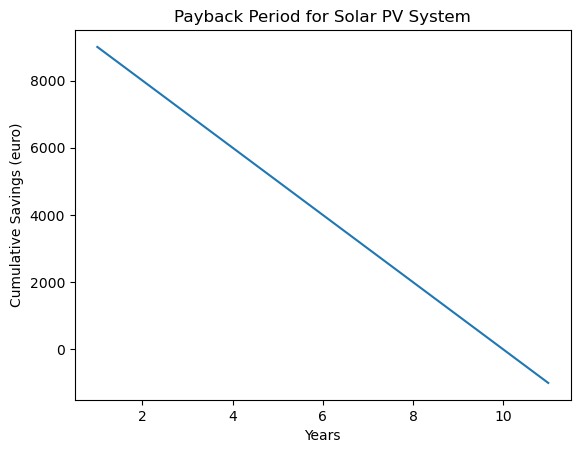

In [107]:
#Here just exploring the use of the panel tool after David's lecture and obviously not of any functional use. I will use again perhaps on th contry comparisons. 
import matplotlib.pyplot as plt
import panel as pn
import numpy as np

# Define function to plot payback period
def plot_payback(system_cost, savings, payback_period):
    x = range(1, int(payback_period) + 2)
    y = [system_cost - savings * i for i in x]
    fig, ax = plt.subplots()
    ax.plot(x, y)
    ax.set_xlabel("Years")
    ax.set_ylabel("Cumulative Savings (euro)")
    ax.set_title("Payback Period for Solar PV System")
    return fig

# Define widgets for input parameters
system_cost_widget = pn.widgets.FloatSlider(name='System Cost', start=5000, end=20000, step=1000, value=10000)
savings_widget = pn.widgets.FloatSlider(name='Savings', start=500, end=2000, step=100, value=1000)
payback_period_widget = pn.widgets.IntSlider(name='Payback Period (years)', start=1, end=20, step=1, value=10)

# Define function to update the plot based on widget values
def update_plot(event):
    system_cost = system_cost_widget.value
    savings = savings_widget.value
    payback_period = payback_period_widget.value
    payback_plot.object = plot_payback(system_cost, savings, payback_period)

# Create the initial plot
system_cost = system_cost_widget.value
savings = savings_widget.value
payback_period = payback_period_widget.value
payback_plot = pn.pane.Matplotlib(plot_payback(system_cost, savings, payback_period), responsive=True, tight=True)

# Attach update function to widget events
system_cost_widget.param.watch(update_plot, 'value')
savings_widget.param.watch(update_plot, 'value')
payback_period_widget.param.watch(update_plot, 'value')

# Create the dashboard
dashboard = pn.Column(
    pn.Row(system_cost_widget, savings_widget, payback_period_widget),
    payback_plot,
    width=500
)

dashboard.servable()




In [ ]:
#Start of sentiment analysis from solar panels providers as reviewed by customers from www.solarreviews.com
#the purpose of this is for construction workers who install these systems to underrstand the panels customers like the most




In [109]:
import pandas as pd
import nltk

import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings

# Load the Tweets.csv file into an object object
reviews=pd.read_excel('Solar panels_reviews_394.xlsx')

# Display the first five records
reviews.head(10)

,Time,Field1,Field2
0,James Nesbitt \n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t...,Sunpro Install,"Sergio Campos, very happy with the explanation..."
1,Aydan\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t| Pon...,"Today we feature an installation from BSLBATT,",The installation includes the following compon...
2,David Johnson\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\...,These are the best,Second highest average temperature rating and ...
3,Trey\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t| Monu...,Made in US,Wanted panels made here in US
4,Ross O.\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t| M...,Excellent Quality,Good performance and warranty
5,jfk\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t| Long ...,The Right Panels,"Good efficiency, good life, integrated inverters."
6,Jake Ct\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t| O...,Great Choice,Panels produce even in cloudy weather; look go...
7,Will Middlebrooks\n\t\t\t\t\t\t\t\t\t\t\t\t\t\...,Simply the Best,Working with Ecotech has been hands-down one o...
8,Britt Williams \n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\...,LG panels,"I chose LG panels for their performance, durab..."
9,John S\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t| No...,Attractive and efficient,Very attractive all black panels. Highly rated...


In [110]:
# Display the rows and columns
reviews.shape

(394, 3)

# Data Pre Processing

In [111]:
# Drop records with na vlaues
reviews_df = reviews.dropna()

# Display the rows and columns
reviews_df.shape


(158, 3)

In [112]:
# Store the column of the dataframe named as "text"
X = reviews_df['Field2']

# Display the value "X"
print(X)

0      Sergio Campos, very happy with the explanation...
1      The installation includes the following compon...
2      Second highest average temperature rating and ...
3                          Wanted panels made here in US
4                          Good performance and warranty
                             ...                        
367                                          Works great
368                                   Local and warranty
369    Mission solar panels look great and are made i...
370    The system is not active yet waiting for city ...
371                       Panel provided by EasTex Solar
Name: Field2, Length: 158, dtype: object


In [113]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Create an instance of the VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Define a function to apply VADER sentiment analysis on each review
def get_sentiment(Field2):
    # Get the polarity scores for the text
    scores = sia.polarity_scores(Field2)
    
    # Return the sentiment label based on the compound score
    if scores['compound'] >= 0.05:
        return 'positive'
    elif scores['compound'] <= -0.05:
        return 'negative'
    else:
        return 'neutral'

# Apply the function on the 'Field2' column of the dataframe
reviews_df['sentiment'] = reviews_df['Field2'].apply(get_sentiment)



In [114]:
reviews_df.head(10)

,Time,Field1,Field2,sentiment
0,James Nesbitt \n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t...,Sunpro Install,"Sergio Campos, very happy with the explanation...",positive
1,Aydan\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t| Pon...,"Today we feature an installation from BSLBATT,",The installation includes the following compon...,positive
2,David Johnson\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\...,These are the best,Second highest average temperature rating and ...,positive
3,Trey\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t| Monu...,Made in US,Wanted panels made here in US,neutral
4,Ross O.\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t| M...,Excellent Quality,Good performance and warranty,positive
5,jfk\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t| Long ...,The Right Panels,"Good efficiency, good life, integrated inverters.",positive
6,Jake Ct\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t| O...,Great Choice,Panels produce even in cloudy weather; look go...,positive
7,Will Middlebrooks\n\t\t\t\t\t\t\t\t\t\t\t\t\t\...,Simply the Best,Working with Ecotech has been hands-down one o...,positive
8,Britt Williams \n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\...,LG panels,"I chose LG panels for their performance, durab...",positive
9,John S\n\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t\t| No...,Attractive and efficient,Very attractive all black panels. Highly rated...,positive


In [115]:
# Store the column 'Sentiment'
y = reviews_df['sentiment']

# Display the column 
print(y)

0      positive
1      positive
2      positive
3       neutral
4      positive
         ...   
367    positive
368     neutral
369    positive
370    negative
371     neutral
Name: sentiment, Length: 158, dtype: object


## now to start cleaning the text data

In [116]:
from nltk.corpus import stopwords
import string
from nltk.stem import PorterStemmer

In [117]:
# Store the stopwords into the object named as "stop_words"
stop_words = stopwords.words('english')

# Store the string.punctuation into an object punct
punct = string.punctuation

# Initialise an object using a method PorterStemmer
stemmer = PorterStemmer()

In [118]:
import re

cleaned_data=[]

# For loop from first value to length(X), ^a-zA-Z means include small and capital case letters

for i in range(len(X)):
    tweet = re.sub('[^a-zA-Z]', ' ', X.iloc[i])
    tweet = tweet.lower().split()
    tweet = [stemmer.stem(word) for word in tweet if (word not in stop_words) and (word not in punct)]
    tweet = ' '.join(tweet)
    cleaned_data.append(tweet)

In [119]:
# Display the cleaned_data
cleaned_data

['sergio campo happi explan provid system follow excel',
 'instal includ follow compon x victron energi quattro v kva x froniu primo kw ac coupl ac x ibc solar monocrystallin os hc w east face x ibc solar monocrystallin os hc w west face x bslbatt power wall lifepo kwh v',
 'second highest averag temperatur rate best valu buck part labor warranti year',
 'want panel made us',
 'good perform warranti',
 'good effici good life integr invert',
 'panel produc even cloudi weather look good price good',
 'work ecotech hand one best experi work busi panel kw system instal home spent month work five solar instal design bid compar system without question ecotech highest valu equip design engin reall took time answer million question educ us process front offic staff friendli hilari pleasur work instal team similarli friendli profession effeci took less two day instal panel manner unobtrus clean least eye flawless includ rout attic space big invest famili happier final system ecotech design inst

In [120]:
print(y)

0      positive
1      positive
2      positive
3       neutral
4      positive
         ...   
367    positive
368     neutral
369    positive
370    negative
371     neutral
Name: sentiment, Length: 158, dtype: object


In [121]:
# Collect all columns into dataframe named as sentiment_ordering
sentiment_ordering = ['negative', 'neutral', 'positive']

# store all values into column named as "y"
y = y.apply(lambda x: sentiment_ordering.index(x))

In [122]:
y.head()

0    2
1    2
2    2
3    1
4    2
Name: sentiment, dtype: int64

In [123]:
#use the Bag of Words CountVectorizer to vectorize the words 
from sklearn.feature_extraction.text import CountVectorizer

# Instantiate an object cv by calling a method named as CountVectorzer()
cv    = CountVectorizer(max_features = 3000, stop_words = ['Roof', 'roofer'])

# Train the dataset by calling a fit_transform() method
X_fin = cv.fit_transform(cleaned_data).toarray()

# Display the rows and colums
X_fin.shape

(158, 693)

In [124]:
#carry out naive bayes ML multinomial modelling
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split

# Instantiate an object model by calling a method MultinomialNB()
model = MultinomialNB()

In [125]:
# Split the dataset into training and testing parts
X_train, X_test, y_train, y_test = train_test_split(X_fin, y, test_size = 0.3)

In [126]:
# Train the model by calling a method fit()
model.fit(X_train,y_train)

MultinomialNB()

In [127]:
# Call prediction method
y_pred = model.predict(X_test)

In [128]:
from sklearn.metrics import classification_report

# Instantiate method 
cf = classification_report(y_test, y_pred)

# Display the values of an object cf
print(cf)

              precision    recall  f1-score   support

           0       1.00      0.25      0.40         4
           1       0.14      0.10      0.12        10
           2       0.72      0.85      0.78        34

    accuracy                           0.65        48
   macro avg       0.62      0.40      0.43        48
weighted avg       0.63      0.65      0.61        48



In [129]:
#This model above is very poor. This was expected as the dataset is small with lots of variability in the reviews. In practice I would not use this and prior to carrying out the websraping activity the reviews website claimed to have 1000s of reviews, however, when scraped only extract circa. 390 which is too few IMO. Next I will try extracting commentarty from the news articels in realtion to solar to build a better database. 
#The majority of the reviews are positive and i'm not sure if this is a true refelction of the products or somehow synthetic - in any case the recall and precision for neative and neutralreviews is poor, reflective of the low support and data in the model.
#Google reviews of solar business for solar contractors was also investigated, hoever, only 8 are registered with reviews, and again this data set is too limiting IMO.
# Import the required libraries
# Import the required libraries
from sklearn.datasets import fetch_20newsgroups
import pandas as pd

# Fetch all 20 newsgroups
all_news = fetch_20newsgroups(remove=('headers', 'footers', 'quotes'))

# Filter the news articles that contain "solar" and "PV" in their text
filtered_data = []
for i in range(len(all_news.data)):
    if "solar" in all_news.data[i].lower() and "energy" in all_news.data[i].lower():
        filtered_data.append(all_news.data[i])

# Create a pandas DataFrame from the filtered data
df = pd.DataFrame({'text': filtered_data})
df['target'] = 0  # add a target column with value 0
df['target_names'] = 'solar'  # add a target_names column with value 'solar PV'

# Show the DataFrame
print(df.head(10))
df.info()
#The data here is again very limited, time to move to a larger option via an API


                                                text  target target_names
0  Archive-name: space/new_probes\nLast-modified:...       0        solar
1  Archive-name: space/references\nLast-modified:...       0        solar
2  Archive-name: space/constants\nLast-modified: ...       0        solar
3  Apologies if this gets posted twice, but I don...       0        solar
4  LARSONIAN Astronomy and Physics\n\n           ...       0        solar
5  Archive-name: space/acronyms\nEdition: 8\n\nAc...       0        solar
6  Archive-name: space/probe\nLast-modified: $Dat...       0        solar
7  FOR IMMEDIATE RELEASE           Contact:  OASI...       0        solar
8          Well, lets see....I took a class on th...       0        solar
9  Archive-name: space/math\nLast-modified: $Date...       0        solar
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11 entries, 0 to 10
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 


In [130]:
#This API has a limit of 100 articles per page.
# Import the required libraries
import requests
import pandas as pd

# Set the API endpoint and parameters
url = 'https://newsapi.org/v2/everything'
params = {
    'q': 'solar AND PV OR Complain',
    'pageSize': 100,
    'sortBy': 'publishedAt',
    'apiKey': 'cd73445c3c9f44159bb9d48d23816ed0'  # replace with your API key
}

# Send a GET request to the API endpoint
response = requests.get(url, params=params)

# Extract the articles from the API response
articles = response.json()['articles']

# Create a pandas DataFrame from the articles
df = pd.DataFrame(articles, columns=['title', 'description', 'content'])

# Show the DataFrame
print(df.head())


                                               title  \
0  Turista cai ao fazer selfie nas Cataratas do I...   
1  La tercera personas más rica del planeta tiene...   
2  ‘All of a sudden there’s a house’: could prefa...   
3                        Casa La Loica / elton_léniz   
4  “Don Knuth Plays with ChatGPT” but with ChatGPT-4   

                                         description  \
0                                             Editar   
1  <![CDATA[<p>Villafrechós, un pueblo de la prov...   
2  They were once a byword for poor design but pr...   
3  Não é fácil encontrar um terreno vazio em um b...   
4  A reference to: https://news.ycombinator.com/i...   

                                             content  
0  Turista cai ao fazer selfie nas Cataratas do I...  
1  Villafrechós, un pueblo de la provincia de Val...  
2  A wooden deck stretches out to a view over the...  
3  © Marcos Mendizabal\r\n+ 15\r\n<ul><li>Arquite...  
4  1. Tell me what Donald Knuth says to Stephen W..

In [131]:
df.shape

(100, 3)

In [132]:

df = df.drop_duplicates()


In [133]:
df.shape

(100, 3)

In [134]:
# Store the column of the dataframe named as "text"
X = df['content']

# Display the value "X"
print(X)


0     Turista cai ao fazer selfie nas Cataratas do I...
1     Villafrechós, un pueblo de la provincia de Val...
2     A wooden deck stretches out to a view over the...
3     © Marcos Mendizabal\r\n+ 15\r\n<ul><li>Arquite...
4     1. Tell me what Donald Knuth says to Stephen W...
                            ...                        
95    Ya sabes que cada día buscamos buenas ofertas ...
96    Is nuclear our best green energy option? May 8...
97    Paralysis analysis. It's what happens when you...
98    GRAPHICAARTIS/GETTY IMAGES\r\nThis September m...
99    IPO Stock Of The Week Array Technologies (ARRY...
Name: content, Length: 100, dtype: object


In [135]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Create an instance of the VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Define a function to apply VADER sentiment analysis on each review
def get_sentiment(Field2):
    # Get the polarity scores for the text
    scores = sia.polarity_scores(Field2)
    # Return the sentiment label based on the compound score
    if scores['compound'] >= 0.05:
        return 'positive'
    elif scores['compound'] <= -0.05:
        return 'negative'
    else:
        return 'neutral'

# Apply the function on the 'text' column of the dataframe
df['sentiment'] = df['content'].apply(get_sentiment)


In [136]:
df.head(10)

,title,description,content,sentiment
0,Turista cai ao fazer selfie nas Cataratas do I...,Editar,Turista cai ao fazer selfie nas Cataratas do I...,neutral
1,La tercera personas más rica del planeta tiene...,"<![CDATA[<p>Villafrechós, un pueblo de la prov...","Villafrechós, un pueblo de la provincia de Val...",negative
2,‘All of a sudden there’s a house’: could prefa...,They were once a byword for poor design but pr...,A wooden deck stretches out to a view over the...,positive
3,Casa La Loica / elton_léniz,Não é fácil encontrar um terreno vazio em um b...,© Marcos Mendizabal\r\n+ 15\r\n<ul><li>Arquite...,neutral
4,“Don Knuth Plays with ChatGPT” but with ChatGPT-4,A reference to: https://news.ycombinator.com/i...,1. Tell me what Donald Knuth says to Stephen W...,negative
5,Thales : Successful launch for 5 additional sp...,(marketscreener.com) \n \n \n Successful launc...,Successful launch for 5 additional spare satel...,positive
6,Science news this week: The spark of life in s...,Our weekly roundup of the latest science in th...,It's been a busy week in science news when it ...,positive
7,These areas of the US at 'elevated' risk of bl...,Large swathes of the U.S. could suffer blackou...,(NEXSTAR) Large swathes of the U.S. could suff...,negative
8,U.S. At Risk Of Blackouts This Summer,Extreme weather this summer will strain the U....,Turkish President Recep Tayyip Erdogan…\r\nThe...,negative
9,Garmin Fenix 7 smartwatch receives biggest dis...,Deal | The robust multisport smartwatch has be...,"Unlike many other smartwatch manufacturers, Ga...",neutral


In [137]:
# Store the column if the dataframe named as  "sentiment"
y = df['sentiment']

# Display the column of the dataframe named as "s_entiment"
print(y)

0      neutral
1     negative
2     positive
3      neutral
4     negative
        ...   
95     neutral
96    positive
97    positive
98    positive
99     neutral
Name: sentiment, Length: 100, dtype: object


# Clean Your Text Data

In [138]:
from nltk.corpus import stopwords
import string
from nltk.stem import PorterStemmer

In [139]:
# Store the stopwords into the object named as "stop_words"
stop_words = stopwords.words('english')

# Store the string.punctuation into an object punct
punct = string.punctuation

# Initialise an object using a method PorterStemmer
stemmer = PorterStemmer()

In [140]:
import re

cleaned_data=[]

# For loop from first value to length(X), ^a-zA-Z means include small and capital case letters

for i in range(len(X)):
    content = re.sub('[^a-zA-Z]', ' ', X.iloc[i])
    content = content.lower().split()
    content = [stemmer.stem(word) for word in content if (word not in stop_words) and (word not in punct)]
    content = ' '.join(content)
    cleaned_data.append(content)

In [141]:
# Display the cleaned_data
cleaned_data

['turista cai ao fazer selfi na catarata igua u por flipar testemunha disseram que ele estava sobr parapeito mirant salto bossetti foto para fazer uma selfi quando char',
 'villafrech un pueblo de la provincia de valladolid apena supera lo habitant es demasiado conocido pero en esta localidad naci el abuelo de la tercera persona rica del mundo je char',
 'wooden deck stretch view horizon welcom mountain air blow away insid morn light beckon skylight curtain play afternoo char',
 'marco mendizab ul li arquiteto respon vei miren elton mauricio l niz javiera loayza scarlett greco li li li li li ul mai informa esmeno informa es marco men char',
 'tell donald knuth say stephen wolfram chatgpt sorri confus ai provid real time updat specif convers individu beyond char',
 'success launch addit spare satellit upgrad iridium satellit constel manufactur thale alenia space cann may five addit spare satellit part char',
 'busi week scienc news come anim discov tini jump spider bad actor revis best 

In [142]:
print(y)

0      neutral
1     negative
2     positive
3      neutral
4     negative
        ...   
95     neutral
96    positive
97    positive
98    positive
99     neutral
Name: sentiment, Length: 100, dtype: object


In [143]:
# Collect all columns into dataframe named as sentiment_ordering
sentiment_ordering = ['negative', 'neutral', 'positive']

# store all values into column named as "y"
y = y.apply(lambda x: sentiment_ordering.index(x))

In [144]:
y.head()

0    1
1    0
2    2
3    1
4    0
Name: sentiment, dtype: int64

# Bag of Words using CountVectorizer

In [145]:
from sklearn.feature_extraction.text import CountVectorizer

# Instantiate an object cv by calling a method named as CountVectorzer()
cv    = CountVectorizer(max_features = 3000, stop_words = ['Roof', 'roofer'])

# Train the dataset by calling a fit_transform() method
X_fin = cv.fit_transform(cleaned_data).toarray()

# Display the rows and colums
X_fin.shape

(100, 1416)

In [146]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split

# Instantiate an object model by calling a method MultinomialNB()
model = MultinomialNB()

In [147]:
# Split the dataset into training and testing parts
X_train, X_test, y_train, y_test = train_test_split(X_fin, y, test_size = 0.20)

In [148]:
# Train the model by calling a method fit()
model.fit(X_train,y_train)

MultinomialNB()

In [149]:
# Call predict() method
y_pred = model.predict(X_test)

In [150]:
from sklearn.metrics import classification_report

# Instantiate a mthod named as Cla
cf = classification_report(y_test, y_pred)

# Display the values of an object cf
print(cf)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.40      0.33      0.36         6
           2       0.73      0.73      0.73        11

    accuracy                           0.50        20
   macro avg       0.38      0.35      0.36        20
weighted avg       0.52      0.50      0.51        20



In [151]:
#The above still hasnt impoved the model. Now tomove to a dicussion board where positive and negative views and words are more likely to give a balanced dataset. IF this doesnt work sub sampling will be tested of the majority class (posiitve)

In [152]:
#I will explain in the report my method of webscraping and ethical and legal considerations for this approach
#This approach resulted ina  more subtantial dataset on the construction topic of solar installations and consumer opinions
import pandas as pd
import nltk

import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings

# Load the Tweets.csv file into an object object
db_df=pd.read_excel('Boards.ie_scrape_4.7k.xlsx')

# Display the first five records
db_df.head(10)

,Field1
0,"ZamboniDec 4, 2021\n\nI received this quote du..."
1,"ZamboniDec 4, 2021\n\nI received this quote du..."
2,Cheers to both of you for your replies and the...
3,"I have received a quote for 14 x 365w panels, ..."
4,"ThewiresDec 6, 2021I have received a quote for..."
5,"ThewiresDec 6, 2021\n\nI have received a quote..."
6,"ThewiresDec 6, 2021\n\nI have received a quote..."
7,"DrPhilGDec 7, 2021\n\nhttps://www.boards.ie/di..."
8,"bullit_dodgerDec 7, 2021\n\nhttps://www.boards..."
9,"BobeagleburgerDec 7, 2021\n\nhttps://www.board..."


In [153]:
# Display the rows and columns
db_df.shape

(4760, 1)

# Data Pre Processing

In [154]:
# Drop records with na vlaues
db_df = db_df.dropna()

# Display the rows and columns
db_df.shape


(4759, 1)

In [155]:
# Store the column of the dataframe named as "text"
X = db_df['Field1']

# Display the value "X"
print(X)

0       ZamboniDec 4, 2021\n\nI received this quote du...
1       ZamboniDec 4, 2021\n\nI received this quote du...
2       Cheers to both of you for your replies and the...
3       I have received a quote for 14 x 365w panels, ...
4       ThewiresDec 6, 2021I have received a quote for...
                              ...                        
4755    Long time lurker with very little knowledge. A...
4756    After lurking around for a long time on the fo...
4757    Fingleberries12:59 pm\n\nAfter lurking around ...
4758    Thanks so much for the detailed reply - one of...
4759    Fingleberries2:31 pm\n\nThanks so much for the...
Name: Field1, Length: 4759, dtype: object


In [156]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Create an instance of the VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Define a function to apply VADER sentiment analysis on each review
def get_sentiment(Field1):
    # Get the polarity scores for the text
    scores = sia.polarity_scores(Field1)
    # Return the sentiment label based on the compound score
    if scores['compound'] >= 0.05:
        return 'positive'
    elif scores['compound'] <= -0.05:
        return 'negative'
    else:
        return 'neutral'

# Apply the function on the 'text' column of the dataframe
db_df['sentiment'] = db_df['Field1'].apply(get_sentiment)


In [157]:
db_df.head(10)

,Field1,sentiment
0,"ZamboniDec 4, 2021\n\nI received this quote du...",positive
1,"ZamboniDec 4, 2021\n\nI received this quote du...",positive
2,Cheers to both of you for your replies and the...,positive
3,"I have received a quote for 14 x 365w panels, ...",positive
4,"ThewiresDec 6, 2021I have received a quote for...",positive
5,"ThewiresDec 6, 2021\n\nI have received a quote...",positive
6,"ThewiresDec 6, 2021\n\nI have received a quote...",positive
7,"DrPhilGDec 7, 2021\n\nhttps://www.boards.ie/di...",positive
8,"bullit_dodgerDec 7, 2021\n\nhttps://www.boards...",positive
9,"BobeagleburgerDec 7, 2021\n\nhttps://www.board...",positive


In [158]:
# Store the column if the dataframe named as  "airline_sentiment"
y = db_df['sentiment']

# Display the column of the dataframe named as "airline_sentiment"
print(y)

0       positive
1       positive
2       positive
3       positive
4       positive
          ...   
4755     neutral
4756    positive
4757    positive
4758    positive
4759    positive
Name: sentiment, Length: 4759, dtype: object


# Clean Your Text Data

In [159]:
from nltk.corpus import stopwords
import string
from nltk.stem import PorterStemmer

In [160]:
# Store the stopwords into the object named as "stop_words"
stop_words = stopwords.words('english')

# Store the string.punctuation into an object punct
punct = string.punctuation

# Initialise an object using a method PorterStemmer
stemmer = PorterStemmer()

In [161]:
import re

cleaned_data=[]

# For loop from first value to length(X), ^a-zA-Z means include small and capital case letters

for i in range(len(X)):
    Field1 = re.sub('[^a-zA-Z]', ' ', X.iloc[i])
    Field1 = Field1.lower().split()
    Field1 = [stemmer.stem(word) for word in Field1 if (word not in stop_words) and (word not in punct)]
    Field1 = ' '.join(Field1)
    cleaned_data.append(Field1)

In [162]:
# Display the cleaned_data
cleaned_data

['zambonidec receiv quot week dublin properti kw system invert eddi kw batteri total grant eddi soli invert seem far equat new welcom opinion thank price per kw panel includ invert system k batteri k eddi k k daylight robberi still high side',
 'zambonidec receiv quot week dublin properti kw system invert eddi kw batteri total grant eddi soli invert seem far equat new welcom opinion thank k add invert guidanc level would factor panel cost guidanc simpli k per kwp panel k per kw batteri eddi',
 'cheer repli correct invert sourc quot morn',
 'receiv quot x w panel invert east west system kw batteri ev charg point grant price twice board formula bit extra work exist built solar water heat panel remov still quot bit crazi recommend instal cork also look get heat pump instal recommend compani thank',
 'thewiresdec receiv quot x w panel invert east west system kw batteri grant price twice board formula bit extra work exist built solar water heat panel remov still quot bit crazi recommend ins

In [163]:
print(y)

0       positive
1       positive
2       positive
3       positive
4       positive
          ...   
4755     neutral
4756    positive
4757    positive
4758    positive
4759    positive
Name: sentiment, Length: 4759, dtype: object


In [164]:
# Collect all columns into dataframe named as sentiment_ordering
sentiment_ordering = ['negative', 'neutral', 'positive']

# store all values into column named as "y"
y = y.apply(lambda x: sentiment_ordering.index(x))

In [165]:
db_df.head()

,Field1,sentiment
0,"ZamboniDec 4, 2021\n\nI received this quote du...",positive
1,"ZamboniDec 4, 2021\n\nI received this quote du...",positive
2,Cheers to both of you for your replies and the...,positive
3,"I have received a quote for 14 x 365w panels, ...",positive
4,"ThewiresDec 6, 2021I have received a quote for...",positive


# Bag of Words using CountVectorizer

In [166]:
from sklearn.feature_extraction.text import CountVectorizer

# Instantiate an object cv by calling a method named as CountVectorzer()
cv = CountVectorizer(max_features = 7000, stop_words = ['Board', 'ie', 'battery'])

# Train the dataset by calling a fit_transform() method
X_fin = cv.fit_transform(cleaned_data).toarray()

# Display the rows and colums
X_fin.shape

(4759, 7000)

In [167]:
from sklearn.model_selection import *
from sklearn.linear_model import LinearRegression
import pandas as pd
# Split the dataset into training and testing parts
X_train, X_test, y_train, y_test = train_test_split(X_fin, y, test_size = 0.3)

In [168]:
# Train the model by calling a method fit()
model.fit(X_train,y_train)

MultinomialNB()

In [169]:
# Call predict() method
y_pred = model.predict(X_test)

In [170]:
from sklearn.metrics import classification_report

# Instantiate a mthod named as Cla
cf = classification_report(y_test, y_pred)

# Display the values of an object cf
print(cf)

              precision    recall  f1-score   support

           0       0.38      0.21      0.27       174
           1       0.62      0.08      0.14       126
           2       0.82      0.95      0.88      1128

    accuracy                           0.79      1428
   macro avg       0.61      0.41      0.43      1428
weighted avg       0.75      0.79      0.74      1428



In [171]:
#The negative comments (n=155) are compartively low so some undersampling of the majority class will be undertaken to alance the data and attempt to improve the precision and recall for negative and neutral. On summary analysis of the results it appears that the positive predicition is overfitted at this point.


In [172]:
import pandas as pd
import nltk

import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings

# Load the boards.ie discussion board extract into an object object
db_df=pd.read_excel('Boards.ie_scrape_4.7k.xlsx')

# Display the first five records
db_df.head(10)

,Field1
0,"ZamboniDec 4, 2021\n\nI received this quote du..."
1,"ZamboniDec 4, 2021\n\nI received this quote du..."
2,Cheers to both of you for your replies and the...
3,"I have received a quote for 14 x 365w panels, ..."
4,"ThewiresDec 6, 2021I have received a quote for..."
5,"ThewiresDec 6, 2021\n\nI have received a quote..."
6,"ThewiresDec 6, 2021\n\nI have received a quote..."
7,"DrPhilGDec 7, 2021\n\nhttps://www.boards.ie/di..."
8,"bullit_dodgerDec 7, 2021\n\nhttps://www.boards..."
9,"BobeagleburgerDec 7, 2021\n\nhttps://www.board..."


In [173]:
# Display the rows and columns
db_df.shape

(4760, 1)

# Data Pre Processing

In [174]:
# Drop records with na vlaues
db_df = db_df.dropna()

# Display the rows and columns
db_df.shape


(4759, 1)

In [175]:
# Store the column of the dataframe named as "text"
X = db_df['Field1']

# Display the value "X"
print(X)

0       ZamboniDec 4, 2021\n\nI received this quote du...
1       ZamboniDec 4, 2021\n\nI received this quote du...
2       Cheers to both of you for your replies and the...
3       I have received a quote for 14 x 365w panels, ...
4       ThewiresDec 6, 2021I have received a quote for...
                              ...                        
4755    Long time lurker with very little knowledge. A...
4756    After lurking around for a long time on the fo...
4757    Fingleberries12:59 pm\n\nAfter lurking around ...
4758    Thanks so much for the detailed reply - one of...
4759    Fingleberries2:31 pm\n\nThanks so much for the...
Name: Field1, Length: 4759, dtype: object


In [176]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Create an instance of the VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Define a function to apply VADER sentiment analysis on each review
def get_sentiment(Field1):
    # Get the polarity scores for the text
    scores = sia.polarity_scores(Field1)
    # Return the sentiment label based on the compound score
    if scores['compound'] >= 0.05:
        return 'positive'
    elif scores['compound'] <= -0.05:
        return 'negative'
    else:
        return 'neutral'

# Apply the function on the 'text' column of the dataframe
db_df['sentiment'] = db_df['Field1'].apply(get_sentiment)


In [177]:
db_df.head(10)

,Field1,sentiment
0,"ZamboniDec 4, 2021\n\nI received this quote du...",positive
1,"ZamboniDec 4, 2021\n\nI received this quote du...",positive
2,Cheers to both of you for your replies and the...,positive
3,"I have received a quote for 14 x 365w panels, ...",positive
4,"ThewiresDec 6, 2021I have received a quote for...",positive
5,"ThewiresDec 6, 2021\n\nI have received a quote...",positive
6,"ThewiresDec 6, 2021\n\nI have received a quote...",positive
7,"DrPhilGDec 7, 2021\n\nhttps://www.boards.ie/di...",positive
8,"bullit_dodgerDec 7, 2021\n\nhttps://www.boards...",positive
9,"BobeagleburgerDec 7, 2021\n\nhttps://www.board...",positive


In [178]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score
from imblearn.under_sampling import NearMiss
import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings

In [179]:
# Store the column if the dataframe named as  "airline_sentiment"
y = db_df['sentiment']

# Display the column of the dataframe named as "airline_sentiment"
print(y)

0       positive
1       positive
2       positive
3       positive
4       positive
          ...   
4755     neutral
4756    positive
4757    positive
4758    positive
4759    positive
Name: sentiment, Length: 4759, dtype: object


# Clean Your Text Data

In [180]:
from nltk.corpus import stopwords
import string
from nltk.stem import PorterStemmer

In [181]:
# Store the stopwords into the object named as "stop_words"
stop_words = stopwords.words('english')

# Store the string.punctuation into an object punct
punct = string.punctuation

# Initialise an object using a method PorterStemmer
stemmer = PorterStemmer()

In [182]:
import re

cleaned_data=[]

# For loop from first value to length(X), ^a-zA-Z means include small and capital case letters

for i in range(len(X)):
    Field1 = re.sub('[^a-zA-Z]', ' ', X.iloc[i])
    Field1 = Field1.lower().split()
    Field1 = [stemmer.stem(word) for word in Field1 if (word not in stop_words) and (word not in punct)]
    Field1 = ' '.join(Field1)
    cleaned_data.append(Field1)

In [183]:
# Display the cleaned_data
cleaned_data

['zambonidec receiv quot week dublin properti kw system invert eddi kw batteri total grant eddi soli invert seem far equat new welcom opinion thank price per kw panel includ invert system k batteri k eddi k k daylight robberi still high side',
 'zambonidec receiv quot week dublin properti kw system invert eddi kw batteri total grant eddi soli invert seem far equat new welcom opinion thank k add invert guidanc level would factor panel cost guidanc simpli k per kwp panel k per kw batteri eddi',
 'cheer repli correct invert sourc quot morn',
 'receiv quot x w panel invert east west system kw batteri ev charg point grant price twice board formula bit extra work exist built solar water heat panel remov still quot bit crazi recommend instal cork also look get heat pump instal recommend compani thank',
 'thewiresdec receiv quot x w panel invert east west system kw batteri grant price twice board formula bit extra work exist built solar water heat panel remov still quot bit crazi recommend ins

In [184]:
print(y)

0       positive
1       positive
2       positive
3       positive
4       positive
          ...   
4755     neutral
4756    positive
4757    positive
4758    positive
4759    positive
Name: sentiment, Length: 4759, dtype: object


In [185]:
# Collect all columns into dataframe named as sentiment_ordering
sentiment_ordering = ['negative', 'neutral', 'positive']

# store all values into column named as "y"
y = y.apply(lambda x: sentiment_ordering.index(x))

In [186]:
db_df.head()

,Field1,sentiment
0,"ZamboniDec 4, 2021\n\nI received this quote du...",positive
1,"ZamboniDec 4, 2021\n\nI received this quote du...",positive
2,Cheers to both of you for your replies and the...,positive
3,"I have received a quote for 14 x 365w panels, ...",positive
4,"ThewiresDec 6, 2021I have received a quote for...",positive


In [187]:
y.info

<bound method Series.info of 0       2
1       2
2       2
3       2
4       2
       ..
4755    1
4756    2
4757    2
4758    2
4759    2
Name: sentiment, Length: 4759, dtype: int64>

In [188]:
db_df.head()

,Field1,sentiment
0,"ZamboniDec 4, 2021\n\nI received this quote du...",positive
1,"ZamboniDec 4, 2021\n\nI received this quote du...",positive
2,Cheers to both of you for your replies and the...,positive
3,"I have received a quote for 14 x 365w panels, ...",positive
4,"ThewiresDec 6, 2021I have received a quote for...",positive


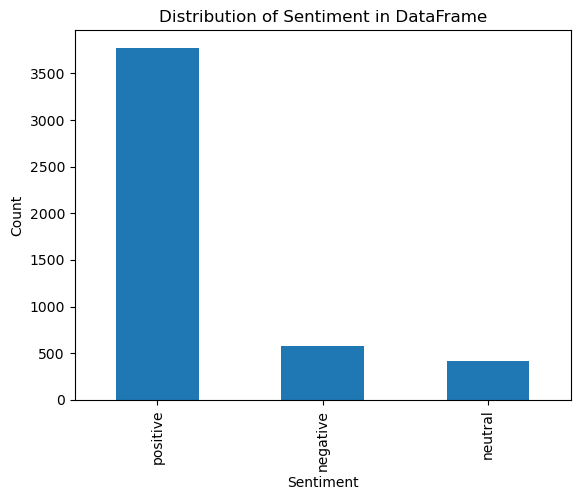

In [189]:
import pandas as pd
import matplotlib.pyplot as plt

sentiment_counts = db_df['sentiment'].value_counts()

#  bar plot
sentiment_counts.plot(kind='bar')

#labels and title
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.title('Distribution of Sentiment in DataFrame')
plt.show()


# Bag of Words using CountVectorizer

In [190]:
from sklearn.feature_extraction.text import CountVectorizer

# Instantiate an object cv by calling a method named as CountVectorzer()
cv = CountVectorizer(max_features = 5000, stop_words = ['Board', 'ie', 'battery'])

# Train the dataset by calling a fit_transform() method
X_fin = cv.fit_transform(cleaned_data).toarray()

# Display the rows and colums
X_fin.shape

(4759, 5000)

In [191]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split

# Instantiate an object model by calling a method MultinomialNB()
model = MultinomialNB()

In [192]:
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.under_sampling import RandomUnderSampler
#using weights similar to the distribution from the box plot above.
Xfin, y = make_classification(n_classes=3, class_sep=3, weights=[0.17, 0.15], 
                           n_informative=3, n_redundant=1, flip_y=0, 
                           n_features=20, n_clusters_per_class=1, n_samples=4759, 
                           random_state=42)

print('Original dataset shape %s' % Counter(y))
# Original dataset shape Counter({0: 7000, 1: 2000, 2: 1000})

rus = RandomUnderSampler(random_state=42)
X_fin, y = rus.fit_resample(X_fin, y)

print('Resampled dataset shape %s' % Counter(y))
# Resampled dataset shape Counter({0: 1000, 1: 1000, 2: 1000})


Original dataset shape Counter({2: 3236, 0: 810, 1: 713})
Resampled dataset shape Counter({0: 713, 1: 713, 2: 713})


In [193]:
# Split the dataset into training and testing parts
X_train, X_test, y_train, y_test = train_test_split(X_fin, y, test_size = 0.3)

In [194]:
# Train the model by calling a method fit()
model.fit(X_train,y_train)

MultinomialNB()

In [195]:
# Call predict() method
y_pred = model.predict(X_test)

In [196]:
from sklearn.metrics import classification_report

# Instantiate a mthod named as Cla
cf = classification_report(y_test, y_pred)

# Display the values of an object cf
print(cf)

              precision    recall  f1-score   support

           0       0.31      0.31      0.31       204
           1       0.36      0.34      0.35       212
           2       0.36      0.37      0.37       226

    accuracy                           0.34       642
   macro avg       0.34      0.34      0.34       642
weighted avg       0.34      0.34      0.34       642



In [197]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report

# Define the parameter grid to search over
param_grid = {
    'alpha': [0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0], 
    'fit_prior': [True, False], 
    'class_prior': [None, [0.3, 0.7], [0.4, 0.6], [0.2, 0.8]]
}

# Instantiate an object model by calling a method MultinomialNB()
model = MultinomialNB()

# Split the dataset into training and testing parts
X_train, X_test, y_train, y_test = train_test_split(X_fin, y, test_size=0.30)

# Instantiate a GridSearchCV object
grid_search = GridSearchCV(model, param_grid, cv=5, n_jobs=-1)

# Fit the GridSearchCV object to the training data
grid_search.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = grid_search.predict(X_test)

# Display the classification report
cf = classification_report(y_test, y_pred)
print(cf)

# Display the best hyperparameters
print("Best hyperparameters: ", grid_search.best_params_)

              precision    recall  f1-score   support

           0       0.32      0.30      0.31       212
           1       0.35      0.40      0.38       208
           2       0.34      0.31      0.33       222

    accuracy                           0.34       642
   macro avg       0.34      0.34      0.34       642
weighted avg       0.34      0.34      0.34       642

Best hyperparameters:  {'alpha': 0.1, 'class_prior': None, 'fit_prior': True}


In [198]:
from sklearn.model_selection import cross_val_score, KFold

# Set up the cross-validation scheme
kf = KFold(n_splits=5)

# Instantiate a model with the best hyperparameters found from GridSearchCV
best_model = MultinomialNB(alpha=5.0, class_prior=None, fit_prior=False)

# Perform 5-fold cross-validation and get the scores
scores = cross_val_score(best_model, X_train, y_train, cv=kf)

# Print the scores and the average score
print("Cross-validation scores:", scores)
print("Average score:", scores.mean())


Cross-validation scores: [0.33333333 0.36333333 0.34113712 0.32441472 0.33779264]
Average score: 0.3400022296544035


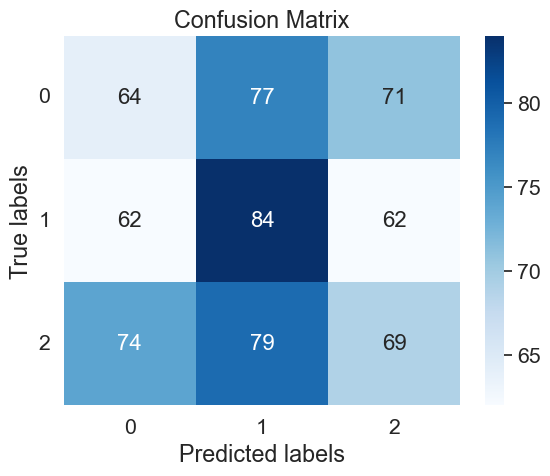

In [199]:
import seaborn as sns
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
sns.set(font_scale=1.4)
sns.heatmap(cm, annot=True, annot_kws={"size": 16}, cmap='Blues', fmt='g')

# Add labels, title and ticks
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')

# Rotate and align the tick labels
plt.xticks(rotation=0, horizontalalignment='center')
plt.yticks(rotation=0, verticalalignment='center')

plt.show()

In [200]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report

# Define the parameter grid to search over
param_grid = {
    'alpha': [0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0], 
    'fit_prior': [True, False], 
    'class_prior': [None, [0.3, 0.7], [0.4, 0.6], [0.2, 0.8]]
}

# Instantiate an object model by calling a method MultinomialNB()
model = MultinomialNB()

# Split the dataset into training and testing parts
X_train, X_test, y_train, y_test = train_test_split(X_fin, y, test_size=0.30)

# Instantiate a GridSearchCV object
grid_search = GridSearchCV(model, param_grid, cv=5, n_jobs=-1)

# Fit the GridSearchCV object to the training data
grid_search.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = grid_search.predict(X_test)

# Display the classification report
cf = classification_report(y_test, y_pred)
print(cf)

# Display the best hyperparameters
print("Best hyperparameters: ", grid_search.best_params_)

              precision    recall  f1-score   support

           0       0.30      0.38      0.34       202
           1       0.36      0.23      0.28       216
           2       0.35      0.40      0.38       224

    accuracy                           0.34       642
   macro avg       0.34      0.34      0.33       642
weighted avg       0.34      0.34      0.33       642

Best hyperparameters:  {'alpha': 5.0, 'class_prior': None, 'fit_prior': True}


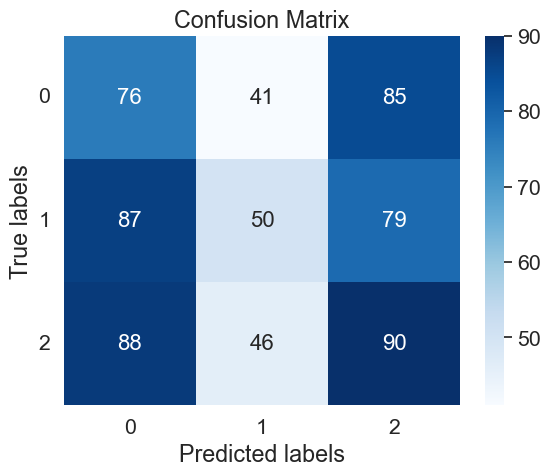

In [201]:
import seaborn as sns
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
sns.set(font_scale=1.4)
sns.heatmap(cm, annot=True, annot_kws={"size": 16}, cmap='Blues', fmt='g')

# Add labels, title and ticks
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')

# Rotate and align the tick labels
plt.xticks(rotation=0, horizontalalignment='center')
plt.yticks(rotation=0, verticalalignment='center')

plt.show()

In [202]:
from sklearn.model_selection import cross_val_score, KFold

# Set up the cross-validation scheme
kf = KFold(n_splits=5)

# Instantiate a model with the best hyperparameters found from GridSearchCV
best_model = MultinomialNB(alpha=10, class_prior=None, fit_prior=True)

# Perform 5-fold cross-validation and get the scores
scores = cross_val_score(best_model, X_train, y_train, cv=kf)

# Print the scores and the average score
print("Cross-validation scores:", scores)
print("Average score:", scores.mean())


Cross-validation scores: [0.4        0.35666667 0.37123746 0.30434783 0.30434783]
Average score: 0.34731995540691196


In [203]:
import pandas as pd

# Select 400 samples from each class in the sentiment column
samples_per_class = 400
selected_data = pd.concat([db_df[db_df['sentiment'] == label].sample(samples_per_class) for label in db_df['sentiment'].unique()])

# Print the selected data to verify that the operation was successful
print(selected_data.head())


                                                 Field1 sentiment
672   MAULBROOKFeb 2, 2022\n\n100% RIPPED OFF. Did t...  positive
2911  To give a sense of what to expect. With our 5k...  positive
2626  sosqJul 14, 2022\n\nSystem size: 4 KWp - 10 pa...  positive
992   LebruskiFeb 25, 2022\n\nA great forum full of ...  positive
759                        DIY battery Powerwalls so :)  positive


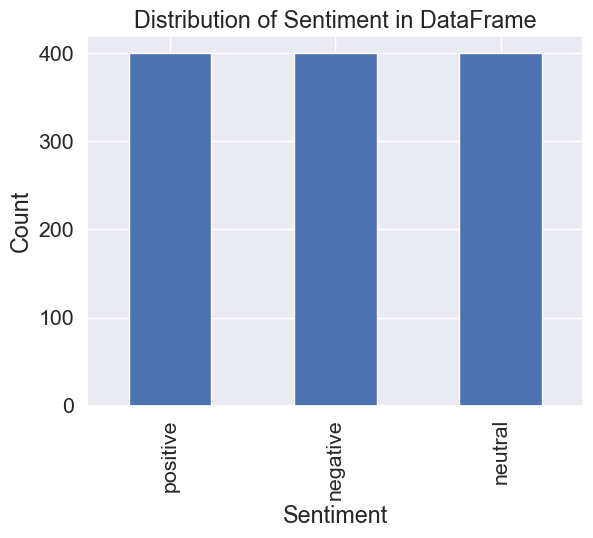

In [204]:
import pandas as pd
import matplotlib.pyplot as plt

sentiment_counts = selected_data['sentiment'].value_counts()

#  bar plot
sentiment_counts.plot(kind='bar')

#labels and title
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.title('Distribution of Sentiment in DataFrame')
plt.show()

In [205]:
#in one final attempt witht the above balanced dataset, i will try to get better predicitve output.
selected_data.shape

(1200, 2)

In [206]:
selected_data.head()

,Field1,sentiment
672,"MAULBROOKFeb 2, 2022\n\n100% RIPPED OFF. Did t...",positive
2911,To give a sense of what to expect. With our 5k...,positive
2626,"sosqJul 14, 2022\n\nSystem size: 4 KWp - 10 pa...",positive
992,"LebruskiFeb 25, 2022\n\nA great forum full of ...",positive
759,DIY battery Powerwalls so :),positive


In [207]:
selected_data

,Field1,sentiment
672,"MAULBROOKFeb 2, 2022\n\n100% RIPPED OFF. Did t...",positive
2911,To give a sense of what to expect. With our 5k...,positive
2626,"sosqJul 14, 2022\n\nSystem size: 4 KWp - 10 pa...",positive
992,"LebruskiFeb 25, 2022\n\nA great forum full of ...",positive
759,DIY battery Powerwalls so :),positive
...,...,...
378,"MAULBROOKJan 14, 2022\n\nhttps://www.boards.ie...",neutral
2611,"Black_KnightJul 13, 2022\n\nAnother quote. Sim...",neutral
3840,"Also beware, April will come around fast with ...",neutral
2175,"The devilsMay 26, 2022\n\nFirst electric bill ...",neutral


In [208]:
import pandas as pd
import nltk

import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings



# Data Pre Processing

In [209]:
# Drop records with na vlaues
selected_data = selected_data.dropna()

# Display the rows and columns
selected_data.shape


(1200, 2)

In [210]:
# Store the column of the dataframe named as "text"
X = selected_data['Field1']

# Display the value "X"
print(X)

672     MAULBROOKFeb 2, 2022\n\n100% RIPPED OFF. Did t...
2911    To give a sense of what to expect. With our 5k...
2626    sosqJul 14, 2022\n\nSystem size: 4 KWp - 10 pa...
992     LebruskiFeb 25, 2022\n\nA great forum full of ...
759                          DIY battery Powerwalls so :)
                              ...                        
378     MAULBROOKJan 14, 2022\n\nhttps://www.boards.ie...
2611    Black_KnightJul 13, 2022\n\nAnother quote. Sim...
3840    Also beware, April will come around fast with ...
2175    The devilsMay 26, 2022\n\nFirst electric bill ...
184     If you go DIY, then only thing that you actual...
Name: Field1, Length: 1200, dtype: object


In [211]:
# Store the column if the dataframe named as  "airline_sentiment"
y = selected_data['sentiment']

# Display the column of the dataframe named as "airline_sentiment"
print(y)

672     positive
2911    positive
2626    positive
992     positive
759     positive
          ...   
378      neutral
2611     neutral
3840     neutral
2175     neutral
184      neutral
Name: sentiment, Length: 1200, dtype: object


# Clean Your Text Data

In [212]:
from nltk.corpus import stopwords
import string
from nltk.stem import PorterStemmer

In [213]:
# Store the stopwords into the object named as "stop_words"
stop_words = stopwords.words('english')

# Store the string.punctuation into an object punct
punct = string.punctuation

# Initialise an object using a method PorterStemmer
stemmer = PorterStemmer()

In [214]:
import re

cleaned_data=[]

# For loop from first value to length(X), ^a-zA-Z means include small and capital case letters

for i in range(len(X)):
    Field1 = re.sub('[^a-zA-Z]', ' ', X.iloc[i])
    Field1 = Field1.lower().split()
    Field1 = [stemmer.stem(word) for word in Field1 if (word not in stop_words) and (word not in punct)]
    Field1 = ' '.join(Field1)
    cleaned_data.append(Field1)

In [215]:
# Display the cleaned_data
cleaned_data

['maulbrookfeb rip compani name thank confirm ye',
 'give sens expect kwp east west split creat enough energi kwh month fulli run hous ev wnergi wise low usag hous low usag drive assum larg enough hous batteri ev driveway day soak free juic bought singl unit power month pretti flash gener wise day low kwh gener whole day cloud meant see sun day high kwh blue sky heatwav see start drop day get shorter less light delight live get free juic',
 'sosqjul system size kwp panel soli invert ber grant iclud wireless monitor east west split grand good check invert hybrid add batteri want',
 'lebruskifeb great forum full use inform got expens quot earlier week kw panel invert sure size kw batteri k grant start k grant discount would grate peopl would pm recommend live monaghan area make differ thank advanc help wow that price would cover two home compani number name bin call back',
 'diy batteri powerwal',
 'thx budget k even haggl prob get close ask anyon pm good instal cover munster area reason

In [216]:
print(y)

672     positive
2911    positive
2626    positive
992     positive
759     positive
          ...   
378      neutral
2611     neutral
3840     neutral
2175     neutral
184      neutral
Name: sentiment, Length: 1200, dtype: object


In [217]:
# Collect all columns into dataframe named as sentiment_ordering
sentiment_ordering = ['negative', 'neutral', 'positive']

# store all values into column named as "y"
y = y.apply(lambda x: sentiment_ordering.index(x))

In [218]:
y.head()

672     2
2911    2
2626    2
992     2
759     2
Name: sentiment, dtype: int64

# Bag of Words using CountVectorizer

In [219]:
from sklearn.feature_extraction.text import CountVectorizer

#  calling a method named as CountVectorzer()
cv    = CountVectorizer(max_features = 5000, stop_words = ['Roof', 'roofer'])

# Train the dataset by calling a fit_transform
X_fin = cv.fit_transform(cleaned_data).toarray()
X_fin.shape

(1200, 4087)

In [220]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split

#calling a method MultinomialNB()
model = MultinomialNB()

In [221]:
# Split the dataset into training and testing parts
X_train, X_test, y_train, y_test = train_test_split(X_fin, y, test_size = 0.25)

In [222]:
# Train the model 
model.fit(X_train,y_train)

MultinomialNB()

In [223]:

y_pred = model.predict(X_test)


In [224]:
from sklearn.metrics import classification_report

# Instantiate a mthod
cf = classification_report(y_test, y_pred)

print(cf)

              precision    recall  f1-score   support

           0       0.54      0.60      0.56        99
           1       0.73      0.34      0.46       103
           2       0.54      0.78      0.63        98

    accuracy                           0.57       300
   macro avg       0.60      0.57      0.55       300
weighted avg       0.60      0.57      0.55       300



In [225]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report

# Define the parameter grid to search over
param_grid = {
    'alpha': [0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0], 
    'fit_prior': [True, False], 
    'class_prior': [None, [0.3, 0.7], [0.4, 0.6], [0.2, 0.8]]
}

# Instantiate an object model by calling a method MultinomialNB()
model = MultinomialNB()

# Split the dataset into training and testing parts
X_train, X_test, y_train, y_test = train_test_split(X_fin, y, test_size=0.20)

# Instantiate a GridSearchCV object
grid_search = GridSearchCV(model, param_grid, cv=5, n_jobs=-1)

# Fit the GridSearchCV object to the training data
grid_search.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = grid_search.predict(X_test)

# Display the classification report
cf = classification_report(y_test, y_pred)
print(cf)

# Display the best hyperparameters
print("Best hyperparameters: ", grid_search.best_params_)

              precision    recall  f1-score   support

           0       0.61      0.52      0.56        85
           1       0.53      0.51      0.52        77
           2       0.54      0.65      0.59        78

    accuracy                           0.56       240
   macro avg       0.56      0.56      0.56       240
weighted avg       0.56      0.56      0.56       240

Best hyperparameters:  {'alpha': 0.1, 'class_prior': None, 'fit_prior': True}


In [226]:
from sklearn.model_selection import cross_val_score, KFold

# Set up the cross-validation scheme
kf = KFold(n_splits=5)

# Instantiate a model with the best hyperparameters found from GridSearchCV
best_model = MultinomialNB(alpha=0.1, class_prior=None, fit_prior=False)

# Perform 5-fold cross-validation and get the scores
scores = cross_val_score(best_model, X_train, y_train, cv=kf)

# Print the scores and the average score
print("Cross-validation scores:", scores)
print("Average score:", scores.mean())


Cross-validation scores: [0.57291667 0.48958333 0.59375    0.47916667 0.484375  ]
Average score: 0.5239583333333333


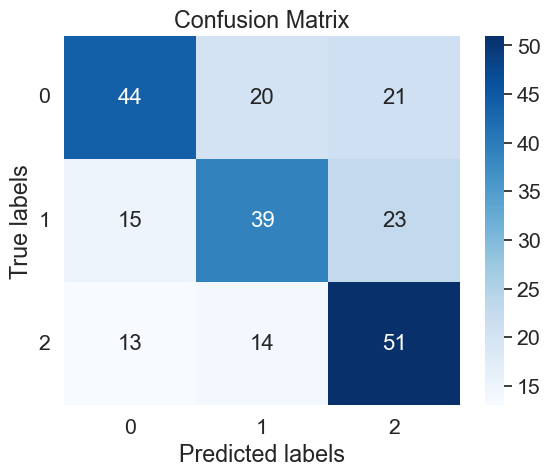

In [227]:
import seaborn as sns
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
sns.set(font_scale=1.4)
sns.heatmap(cm, annot=True, annot_kws={"size": 16}, cmap='Blues', fmt='g')

# Add labels, title and ticks
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')

# Rotate and align the tick labels
plt.xticks(rotation=0, horizontalalignment='center')
plt.yticks(rotation=0, verticalalignment='center')

plt.show()

In [228]:
#This made a significant improment to the model and its more consistant across groups, however similar change a flipping a coin as the predictive power oftheis model. Dealing with general lay public forum infomarion has major varabilirty and may not be the best data to train a model on.
#Out of academic interest i will drop the neutral colum of the data to see if the more destinct groups of pos and negative are easier to predict.

In [229]:
selected_data1 = selected_data[selected_data['sentiment'] != 'neutral']

# Display the rows and columns
selected_data1.shape


(800, 2)

In [230]:
# Store the column of the dataframe named as "text"
X = selected_data1['Field1']

# Display the value "X"
print(X)

672     MAULBROOKFeb 2, 2022\n\n100% RIPPED OFF. Did t...
2911    To give a sense of what to expect. With our 5k...
2626    sosqJul 14, 2022\n\nSystem size: 4 KWp - 10 pa...
992     LebruskiFeb 25, 2022\n\nA great forum full of ...
759                          DIY battery Powerwalls so :)
                              ...                        
87      SouthWesterlyDec 16, 2021\n\nhttps://www.board...
4506    mioniqaMar 29, 2023\n\nApologies if this is a ...
4101    Unfortunately there's no requirement to retain...
351     [Deleted User]Jan 12, 2022\n\nWhat would a 5 K...
3221    Don't forget, the installer gets paid the gros...
Name: Field1, Length: 800, dtype: object


In [231]:
# Store the column if the dataframe named as  "airline_sentiment"
y = selected_data1['sentiment']

# Display the column of the dataframe named as "airline_sentiment"
print(y)

672     positive
2911    positive
2626    positive
992     positive
759     positive
          ...   
87      negative
4506    negative
4101    negative
351     negative
3221    negative
Name: sentiment, Length: 800, dtype: object


# Clean Your Text Data

In [232]:
from nltk.corpus import stopwords
import string
from nltk.stem import PorterStemmer

In [233]:
# Store the stopwords into the object named as "stop_words"
stop_words = stopwords.words('english')

# Store the string.punctuation into an object punct
punct = string.punctuation

# Initialise an object using a method PorterStemmer
stemmer = PorterStemmer()

In [234]:
import re

cleaned_data=[]

# For loop from first value to length(X), ^a-zA-Z means include small and capital case letters

for i in range(len(X)):
    Field1 = re.sub('[^a-zA-Z]', ' ', X.iloc[i])
    Field1 = Field1.lower().split()
    Field1 = [stemmer.stem(word) for word in Field1 if (word not in stop_words) and (word not in punct)]
    Field1 = ' '.join(Field1)
    cleaned_data.append(Field1)

In [235]:
# Display the cleaned_data
cleaned_data

['maulbrookfeb rip compani name thank confirm ye',
 'give sens expect kwp east west split creat enough energi kwh month fulli run hous ev wnergi wise low usag hous low usag drive assum larg enough hous batteri ev driveway day soak free juic bought singl unit power month pretti flash gener wise day low kwh gener whole day cloud meant see sun day high kwh blue sky heatwav see start drop day get shorter less light delight live get free juic',
 'sosqjul system size kwp panel soli invert ber grant iclud wireless monitor east west split grand good check invert hybrid add batteri want',
 'lebruskifeb great forum full use inform got expens quot earlier week kw panel invert sure size kw batteri k grant start k grant discount would grate peopl would pm recommend live monaghan area make differ thank advanc help wow that price would cover two home compani number name bin call back',
 'diy batteri powerwal',
 'thx budget k even haggl prob get close ask anyon pm good instal cover munster area reason

In [236]:
print(y)

672     positive
2911    positive
2626    positive
992     positive
759     positive
          ...   
87      negative
4506    negative
4101    negative
351     negative
3221    negative
Name: sentiment, Length: 800, dtype: object


In [237]:
# Collect all columns into dataframe named as sentiment_ordering
sentiment_ordering = ['negative', 'positive']

# store all values into column named as "y"
y = y.apply(lambda x: sentiment_ordering.index(x))

In [238]:
y.head()

672     1
2911    1
2626    1
992     1
759     1
Name: sentiment, dtype: int64

# Bag of Words using CountVectorizer

In [239]:
from sklearn.feature_extraction.text import CountVectorizer

# Instantiate an object cv by calling a method named as CountVectorzer()
cv    = CountVectorizer(max_features = 4000, stop_words = ['Roof', 'roofer'])

# Train the dataset by calling a fit_transform() method
X_fin = cv.fit_transform(cleaned_data).toarray()

# Display the rows and colums
X_fin.shape

(800, 3787)

In [240]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split

# Instantiate an object model by calling a method MultinomialNB()
model = MultinomialNB()

In [241]:
# Split the dataset into training and testing parts
X_train, X_test, y_train, y_test = train_test_split(X_fin, y, test_size = 0.20)

In [242]:
# Train the model by calling a method fit()
model.fit(X_train,y_train)

MultinomialNB()

In [243]:
# Call predict() method
y_pred = model.predict(X_test)

In [244]:
from sklearn.metrics import classification_report

# Instantiate a mthod named as Cla
cf = classification_report(y_test, y_pred)

# Display the values of an object cf
print(cf)

              precision    recall  f1-score   support

           0       0.76      0.51      0.61        80
           1       0.63      0.84      0.72        80

    accuracy                           0.68       160
   macro avg       0.70      0.68      0.67       160
weighted avg       0.70      0.68      0.67       160



In [245]:
#the predicitve power here has improved again significantly , and in practical terms is also now useable. Comapnies would like to know in general if there are positive or negative reviews, as there not much to achieve from a neutral conversation.
# Dropping the neutral class allows two more destinct groups to be forms permitting the model to achieve greated sepration and classification power.
#This is still on the low side, but in general an improvement on what we discoved above. We will not test the impact of Gridsearrch CV for hyperparameter tuning


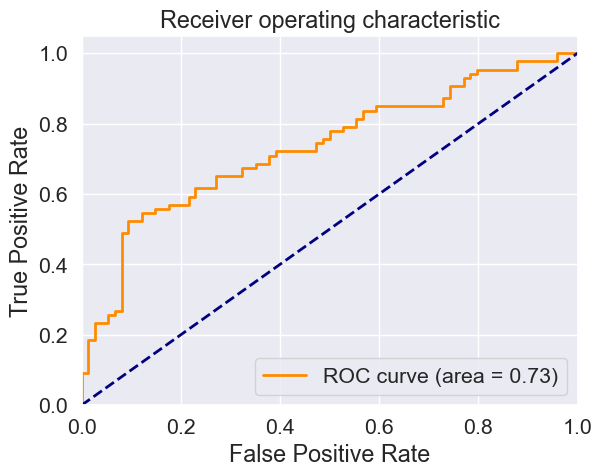

              precision    recall  f1-score   support

           0       0.63      0.62      0.63        74
           1       0.68      0.69      0.68        86

    accuracy                           0.66       160
   macro avg       0.65      0.65      0.65       160
weighted avg       0.66      0.66      0.66       160

Best hyperparameters:  {'alpha': 0.5, 'class_prior': None, 'fit_prior': True}


In [246]:
#The use of Grid seah CV testing alpha, fit prior and class prior resulted in a slight improvment of the model also andmore importantly a more consistent precision, recall and f1 score for positive and negative sentiment
#alpha: strength of the smoothing. fit prior: prior probabilities are learned from the training data and class prior: class_prior was set to None, meaning prior probabilities are computed from the training data as opposed to using a uniform prior
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report

# Define the parameter grid to search over
param_grid = {
    'alpha': [0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10.0], 
    'fit_prior': [True, False], 
    'class_prior': [None, [0.3, 0.7], [0.4, 0.6], [0.2, 0.8]]
}

# Instantiate an object model by calling a method MultinomialNB()
model = MultinomialNB()

# Split the dataset into training and testing parts
X_train, X_test, y_train, y_test = train_test_split(X_fin, y, test_size=0.20)

# Instantiate a GridSearchCV object
grid_search = GridSearchCV(model, param_grid, cv=5, n_jobs=-1)

# Fit the GridSearchCV object to the training data
grid_search.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = grid_search.predict(X_test)

from sklearn.metrics import roc_curve, auc

# Get predicted probabilities for the positive class
y_pred_proba = grid_search.predict_proba(X_test)[:, 1]

# Compute the false positive rate and true positive rate
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)

# Compute the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()


# Display the classification report
cf = classification_report(y_test, y_pred)
print(cf)

# Display the best hyperparameters
print("Best hyperparameters: ", grid_search.best_params_)


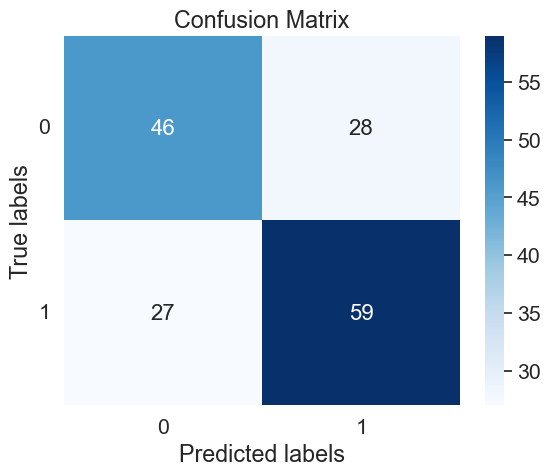

In [247]:
import seaborn as sns
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
sns.set(font_scale=1.4)
sns.heatmap(cm, annot=True, annot_kws={"size": 16}, cmap='Blues', fmt='g')

# Add labels, title and ticks
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')

# Rotate and align the tick labels
plt.xticks(rotation=0, horizontalalignment='center')
plt.yticks(rotation=0, verticalalignment='center')

plt.show()

In [248]:
from sklearn.model_selection import cross_val_score, KFold

# Set up the cross-validation scheme
kf = KFold(n_splits=5)

# Instantiate a model with the best hyperparameters found from GridSearchCV
best_model = MultinomialNB(alpha=0.1, class_prior=None, fit_prior=True)

# Perform 5-fold cross-validation and get the scores
scores = cross_val_score(best_model, X_train, y_train, cv=kf)

# Print the scores and the average score
print("Cross-validation scores:", scores)
print("Average score:", scores.mean())


Cross-validation scores: [0.671875  0.6328125 0.703125  0.6171875 0.6640625]
Average score: 0.6578125


In [249]:
#Comparing with Support Vector Machine (SVM) algorithm c:regularization parameter, gamma (kernel coefficient), kernel type (linear, polynomial, or radial basis function), degree (degree of the polynomial kernel function), coef0 (independent term in kernel function), shrinking (whether to use the shrinking heuristic), and tol (tolerance for stopping criterion).
#There is a trade off here with computer resources (and performace) this tuning is taking over 30 mins to complete and the dataset is not that big.
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import classification_report

# Define the parameter grid to search over
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto'],
    'kernel': ['linear', 'rbf', 'sigmoid'],
    'degree': [2, 3, 4],
    'coef0': [-1.0, 0.0, 1.0],
    'shrinking': [True, False],
    'tol': [1e-3, 1e-4, 1e-5]
}


# Instantiate an object model by calling a method SVC()
model = SVC()

# Split the dataset into training and testing parts
X_train, X_test, y_train, y_test = train_test_split(X_fin, y, test_size=0.20)

# Instantiate a GridSearchCV object
grid_search = GridSearchCV(model, param_grid, cv=5, n_jobs=-1)

# Fit the GridSearchCV object to the training data
grid_search.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = grid_search.predict(X_test)

from sklearn.metrics import roc_curve, auc

# Get predicted probabilities for the positive class
y_pred_proba = grid_search.predict_proba(X_test)[:, 1]

# Compute the false positive rate and true positive rate
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)

# Compute the area under the ROC curve
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

# Display the classification report
cf = classification_report(y_test, y_pred)
print(cf)

# Display the best hyperparameters
print("Best hyperparameters: ", grid_search.best_params_)


AttributeError: predict_proba is not available when  probability=False

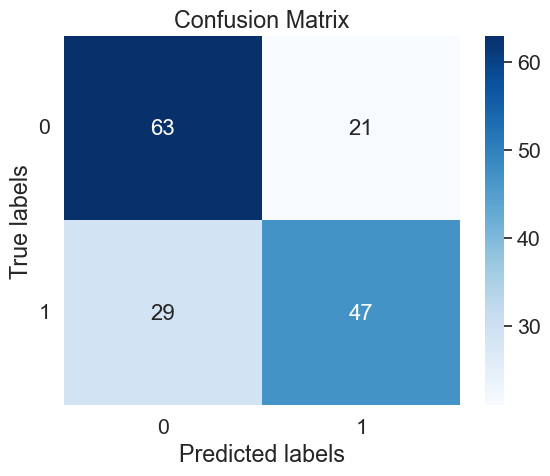

In [251]:
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
sns.set(font_scale=1.4)
sns.heatmap(cm, annot=True, annot_kws={"size": 16}, cmap='Blues', fmt='g')

# Add labels, title and ticks
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')

# Rotate and align the tick labels
plt.xticks(rotation=0, horizontalalignment='center')
plt.yticks(rotation=0, verticalalignment='center')

plt.show()



In [252]:
from sklearn.model_selection import cross_val_score, KFold

# Set up the cross-validation scheme
kf = KFold(n_splits=5)

# Instantiate a model with the best hyperparameters found from GridSearchCV
best_model = MultinomialNB(alpha=0.1, class_prior=None, fit_prior=True)

# Perform 5-fold cross-validation and get the scores
scores = cross_val_score(best_model, X_train, y_train, cv=kf)

# Print the scores and the average score
print("Cross-validation scores:", scores)
print("Average score:", scores.mean())


Cross-validation scores: [0.671875  0.7265625 0.6796875 0.6640625 0.640625 ]
Average score: 0.6765625


In [253]:
End

NameError: name 'End' is not defined